<b> Objective of this Notebook</b>

- We'll make district wise predictions. Meaning while making predictions we'll consider one district at a time.
- We'll consider three time periods: month, week and day.
- We have data from 2011-2015. Data from 2011-2014 will be considered as train data, data from 2015 will be considered as test data
- For each district D, we'll take weekly sum of crime numbers from our train data and use these values to predict weekly numbers of our test data.
- Same logic will be used when we'll be making day level predictions for 2015

Credits: <br>
https://machinelearningmastery.com/moving-average-smoothing-for-time-series-forecasting-python/ <br>
https://machinelearningmastery.com/how-to-develop-lstm-models-for-time-series-forecasting/

In [1]:
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np
import math
import matplotlib.pyplot as plt
from numpy import mean
from numpy import array
from prettytable import PrettyTable
from tqdm import tqdm_notebook

from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense
from keras.layers import Bidirectional
from keras.layers import Flatten
from keras.layers import TimeDistributed
from keras.layers.convolutional import Conv1D
from keras.layers.convolutional import MaxPooling1D

from sklearn.metrics import mean_squared_error

Using TensorFlow backend.


In [2]:
#this CSV file contains clean data
data = pd.read_csv('data/data-clean.csv')
data.index = pd.DatetimeIndex(data.Date)
data = data.sort_index()

In [3]:
def split_sequence(sequence, n_steps):
    X, y = list(), list()
    for i in range(len(sequence)):
        # find the end of this pattern
        end_ix = i + n_steps
        # check if we are beyond the sequence
        if end_ix > len(sequence)-1:
            break
        # gather input and output parts of the pattern
        seq_x, seq_y = sequence[i:end_ix], sequence[end_ix]
        X.append(seq_x)
        y.append(seq_y)
    return array(X), array(y)

# District wise predictions for a month

In [48]:
data_tr = data.loc['2011-01-01':'2014-12-31']
data_test = data.loc['2015-01-01':'2015-12-31']

In [49]:
listOfDist = list(data['District'].unique())

In [50]:
train_d = []
for district in listOfDist:
    df = data_tr[data_tr['District'] == district]
    df_gr = df.groupby(['Year', 'Month']).count()
    train_d.append(list(df_gr['Date'].values))

In [51]:
test_d = []
for district in listOfDist:
    df = data_test[data_test['District'] == district]
    df_gr = df.groupby(['Month']).count()
    test_d.append(list(df_gr['Date'].values))

## Simple Moving Average

District: 1
Actuals: [1237, 935, 1274, 1252, 1361, 1357, 1423, 1346, 1272, 1197, 1145, 1082]
Predictions: [1208.4, 1186.6, 1119.2, 1134.6, 1156.0, 1211.8, 1235.8, 1333.4, 1347.8, 1351.8, 1319.0, 1276.6]


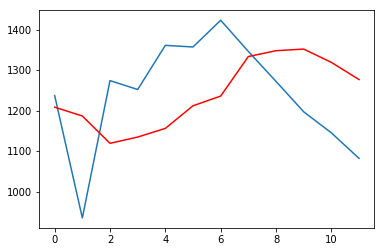

District: 2
Actuals: [522, 445, 510, 471, 596, 524, 619, 603, 580, 583, 526, 536]
Predictions: [565.6, 549.4, 522.4, 507.8, 496.8, 508.8, 509.2, 544.0, 562.6, 584.4, 581.8, 582.2]


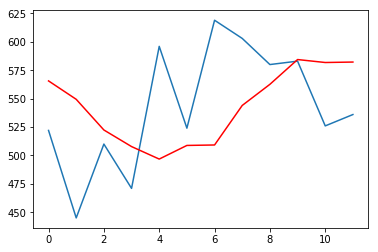

District: 3
Actuals: [1542, 1169, 1630, 1518, 1537, 1521, 1636, 1592, 1464, 1551, 1290, 1335]
Predictions: [1446.4, 1436.4, 1377.4, 1393.2, 1438.8, 1479.2, 1475.0, 1568.4, 1560.8, 1550.0, 1552.8, 1506.6]


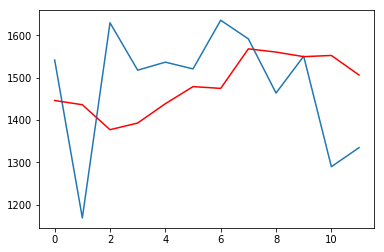

District: 4
Actuals: [606, 515, 688, 665, 849, 803, 666, 794, 695, 764, 578, 551]
Predictions: [676.4, 638.8, 602.8, 587.6, 605.0, 664.6, 704.0, 734.2, 755.4, 761.4, 744.4, 699.4]


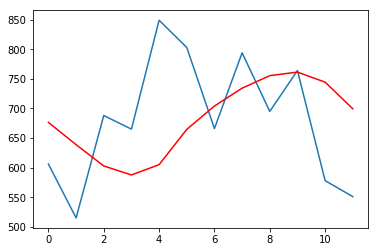

District: 5
Actuals: [1314, 1037, 1333, 1307, 1482, 1515, 1370, 1395, 1298, 1388, 1299, 1272]
Predictions: [1330.4, 1314.2, 1262.0, 1251.0, 1252.6, 1294.6, 1334.8, 1401.4, 1413.8, 1412.0, 1393.2, 1350.0]


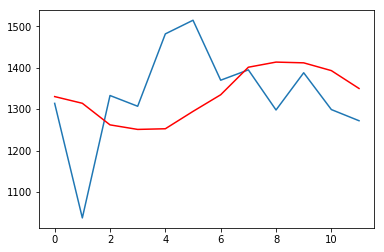

District: 6
Actuals: [986, 714, 1065, 1044, 1044, 1054, 1100, 1223, 1094, 997, 942, 983]
Predictions: [1047.8, 1000.4, 924.4, 938.0, 958.4, 970.6, 984.2, 1061.4, 1093.0, 1103.0, 1093.6, 1071.2]


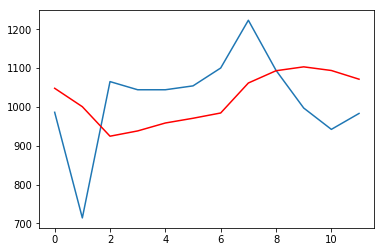

District: 7
Actuals: [1223, 916, 1220, 1159, 1283, 1158, 1311, 1272, 1148, 1251, 1105, 1073]
Predictions: [1169.8, 1160.0, 1113.6, 1107.4, 1118.2, 1160.2, 1147.2, 1226.2, 1236.6, 1234.4, 1228.0, 1217.4]


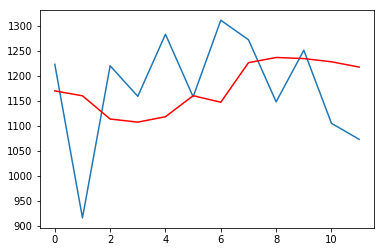

District: 8
Actuals: [807, 690, 856, 875, 995, 1100, 1041, 1129, 1048, 988, 872, 1001]
Predictions: [1007.6, 943.2, 871.6, 845.2, 845.8, 844.6, 903.2, 973.4, 1028.0, 1062.6, 1061.2, 1015.6]


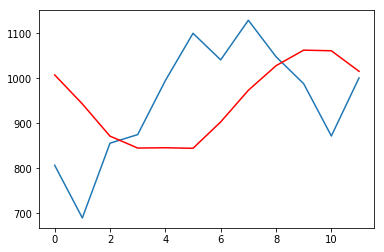

District: 9
Actuals: [740, 564, 805, 799, 899, 861, 947, 898, 946, 969, 812, 768]
Predictions: [878.6, 847.0, 770.6, 737.8, 735.2, 761.4, 785.6, 862.2, 880.8, 910.2, 924.2, 914.4]


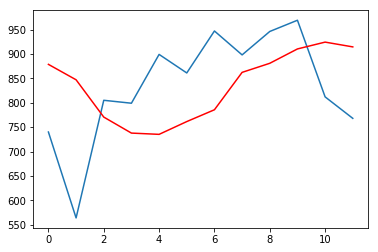

District: 10
Actuals: [1040, 791, 1179, 1327, 1520, 1259, 1323, 1418, 1192, 1209, 1034, 1026]
Predictions: [1175.8, 1100.2, 1020.0, 1014.0, 1072.6, 1171.4, 1215.2, 1321.6, 1369.4, 1342.4, 1280.2, 1235.2]


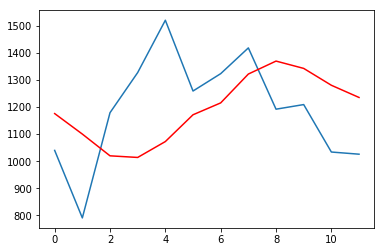

District: 11
Actuals: [948, 684, 917, 893, 986, 885, 1009, 1043, 895, 866, 767, 739]
Predictions: [862.0, 843.0, 800.8, 811.0, 836.2, 885.6, 873.0, 938.0, 963.2, 963.6, 939.6, 916.0]


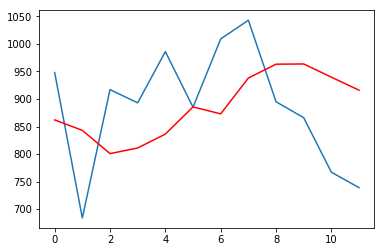

District: 12
Actuals: [644, 520, 647, 708, 725, 699, 751, 835, 831, 741, 656, 690]
Predictions: [750.6, 712.4, 650.2, 631.4, 641.8, 648.8, 659.8, 706.0, 743.6, 768.2, 771.4, 762.8]


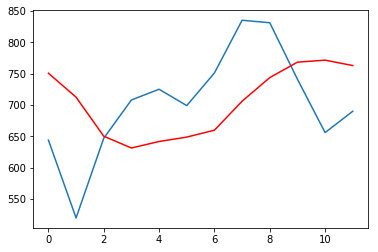

District: 13
Actuals: [1136, 970, 1290, 1273, 1333, 1327, 1381, 1350, 1358, 1261, 1194, 1200]
Predictions: [1272.6, 1229.8, 1152.2, 1158.0, 1173.8, 1200.4, 1238.6, 1320.8, 1332.8, 1349.8, 1335.4, 1308.8]


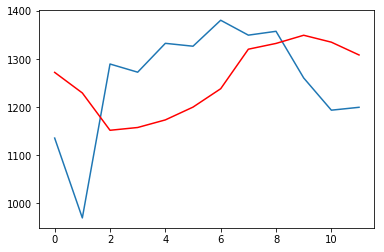

District: 14
Actuals: [749, 597, 827, 846, 922, 1031, 990, 1051, 1053, 978, 845, 875]
Predictions: [960.4, 900.0, 808.8, 778.6, 778.8, 788.2, 844.6, 923.2, 968.0, 1009.4, 1020.6, 983.4]


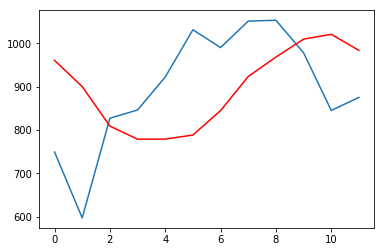

District: 15
Actuals: [311, 247, 304, 316, 347, 353, 355, 408, 379, 346, 301, 305]
Predictions: [347.8, 328.4, 302.0, 293.6, 296.6, 305.0, 313.4, 335.0, 355.8, 368.4, 368.2, 357.8]


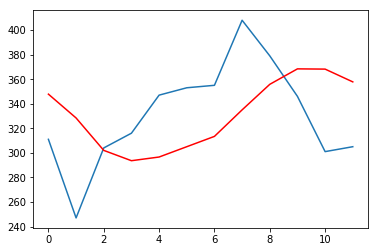

District: 16
Actuals: [882, 723, 920, 962, 1011, 959, 1030, 1043, 978, 903, 876, 764]
Predictions: [912.8, 880.6, 829.6, 833.0, 850.2, 899.6, 915.0, 976.4, 1001.0, 1004.2, 982.6, 966.0]


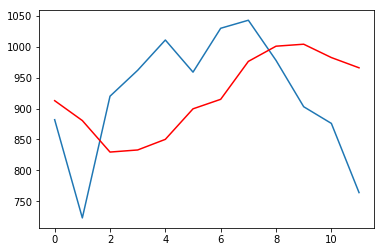

District: 17
Actuals: [929, 732, 981, 971, 1038, 1102, 1117, 1100, 1023, 984, 884, 875]
Predictions: [973.2, 939.0, 880.8, 880.2, 897.6, 930.2, 964.8, 1041.8, 1065.6, 1076.0, 1065.2, 1021.6]


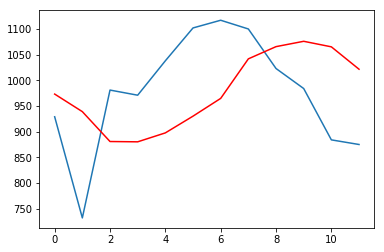

District: 18
Actuals: [666, 539, 660, 632, 685, 655, 707, 716, 660, 701, 563, 668]
Predictions: [661.6, 651.6, 627.4, 619.2, 633.0, 636.4, 634.2, 667.8, 679.0, 684.6, 687.8, 669.4]


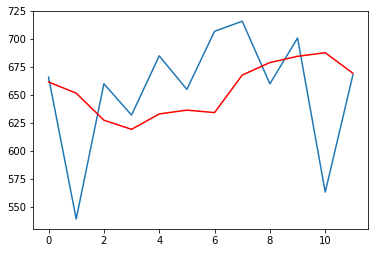

District: 19
Actuals: [817, 588, 817, 847, 845, 934, 1102, 1120, 955, 984, 886, 993]
Predictions: [987.6, 927.0, 853.6, 820.2, 812.4, 782.8, 806.2, 909.0, 969.6, 991.2, 1019.0, 1009.4]


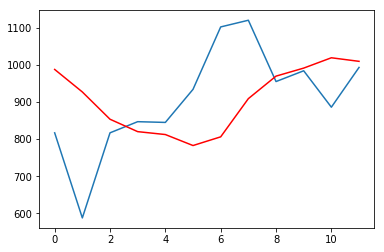

District: 20
Actuals: [758, 639, 932, 945, 1030, 953, 995, 1057, 969, 972, 864, 845]
Predictions: [941.4, 881.6, 815.6, 807.6, 823.8, 860.8, 899.8, 971.0, 996.0, 1000.8, 989.2, 971.4]


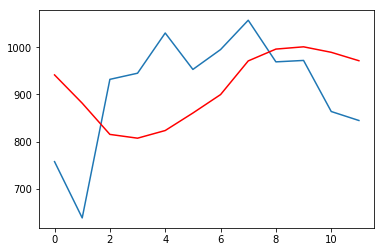

District: 21
Actuals: [762, 642, 768, 820, 937, 912, 1032, 1018, 866, 907, 903, 931]
Predictions: [925.0, 873.8, 829.0, 801.2, 784.6, 785.8, 815.8, 893.8, 943.8, 953.0, 947.0, 945.2]


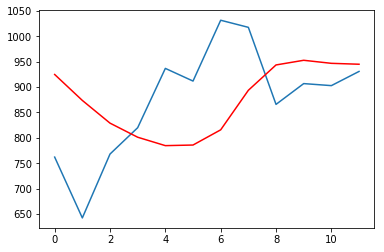

District: 22
Actuals: [586, 546, 604, 561, 666, 603, 581, 627, 648, 654, 558, 627]
Predictions: [622.8, 614.6, 594.2, 584.2, 584.8, 592.6, 596.0, 603.0, 607.6, 625.0, 622.6, 613.6]


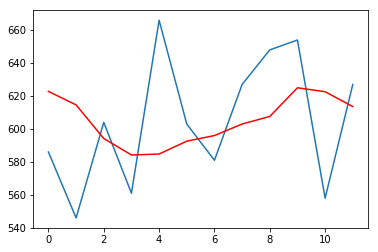

Test RMSE: 131.372


In [53]:
# prepare situation
window = 5
predTot = list()
testTot = list()
# walk forward over time steps in test
for distNum in range(len(train_d)):
    
    history = train_d[distNum]
    test = test_d[distNum]
    preds = []
    for t in range(len(test)):
        length = len(history)
        yhat = mean([history[i] for i in range(length - window, length)])
        obs = test[t]
        preds.append(yhat)
        history.append(obs)
    
    print('District: {}'.format(distNum+1))
    print('Actuals: {}'.format(test))
    print('Predictions: {}'.format(preds))
    # plot
    plt.plot(test)
    plt.plot(preds, color='red')
    plt.show()
    
    testTot = testTot + test
    predTot = predTot + preds
error = mean_squared_error(predTot, testTot) ** .5
print('Test RMSE: %.3f' % error)

## Weighted Moving Average

District: 1
Actuals: [1237, 935, 1274, 1252, 1361, 1357, 1423, 1346, 1272, 1197, 1145, 1082]
Predictions: [1164.7333333333333, 1174.2666666666667, 1090.4, 1142.0, 1181.1333333333334, 1249.4666666666667, 1297.8666666666666, 1360.2666666666667, 1364.4666666666667, 1339.2, 1287.6, 1229.6]


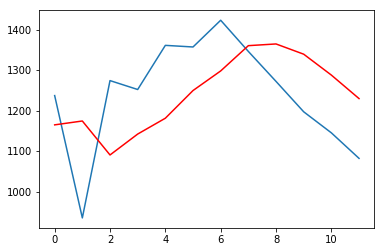

District: 2
Actuals: [522, 445, 510, 471, 596, 524, 619, 603, 580, 583, 526, 536]
Predictions: [553.0666666666667, 538.5333333333333, 503.73333333333335, 499.6, 487.3333333333333, 520.4, 525.4666666666667, 562.0666666666667, 581.7333333333333, 587.5333333333333, 587.0666666666667, 568.4666666666667]


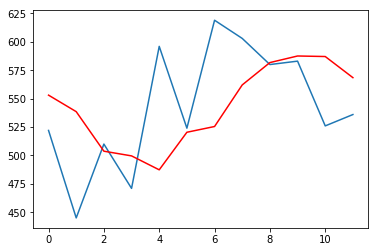

District: 3
Actuals: [1542, 1169, 1630, 1518, 1537, 1521, 1636, 1592, 1464, 1551, 1290, 1335]
Predictions: [1400.5333333333333, 1432.4, 1343.2666666666667, 1427.4666666666667, 1469.0666666666666, 1501.8, 1515.7333333333333, 1569.4, 1577.2666666666667, 1545.0, 1545.3333333333333, 1457.7333333333333]


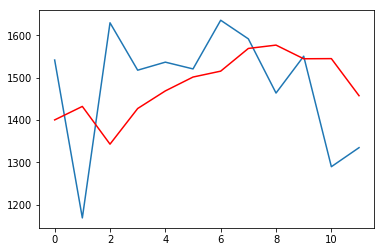

District: 4
Actuals: [606, 515, 688, 665, 849, 803, 666, 794, 695, 764, 578, 551]
Predictions: [636.2, 612.7333333333333, 571.4666666666667, 599.8666666666667, 625.6666666666666, 707.0, 753.1333333333333, 740.4666666666667, 760.4, 740.2666666666667, 741.1333333333333, 685.6666666666666]


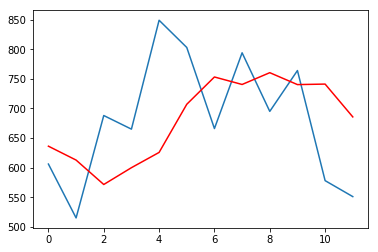

District: 5
Actuals: [1314, 1037, 1333, 1307, 1482, 1515, 1370, 1395, 1298, 1388, 1299, 1272]
Predictions: [1314.0666666666666, 1308.6, 1216.2, 1239.8666666666666, 1258.5333333333333, 1335.0, 1408.4666666666667, 1420.2, 1418.0666666666666, 1379.4666666666667, 1371.4666666666667, 1340.0666666666666]


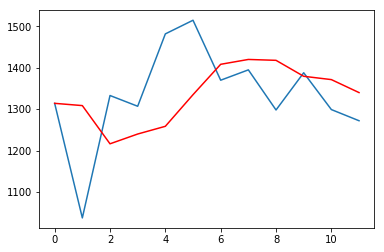

District: 6
Actuals: [986, 714, 1065, 1044, 1044, 1054, 1100, 1223, 1094, 997, 942, 983]
Predictions: [1005.6666666666666, 985.0666666666667, 889.6, 936.4666666666667, 971.8, 1000.3333333333334, 1028.1333333333334, 1066.7333333333333, 1120.6, 1120.9333333333334, 1085.6, 1035.0666666666666]


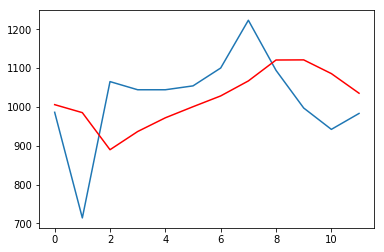

District: 7
Actuals: [1223, 916, 1220, 1159, 1283, 1158, 1311, 1272, 1148, 1251, 1105, 1073]
Predictions: [1140.4, 1158.1333333333334, 1076.8, 1112.2666666666667, 1129.4666666666667, 1184.4, 1183.6666666666667, 1238.2666666666667, 1253.5333333333333, 1224.0, 1229.5333333333333, 1188.5333333333333]


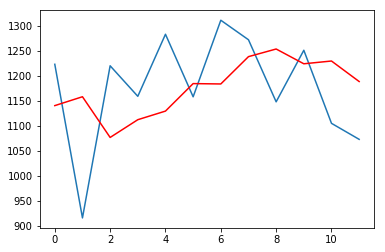

District: 8
Actuals: [807, 690, 856, 875, 995, 1100, 1041, 1129, 1048, 988, 872, 1001]
Predictions: [978.8, 911.9333333333333, 827.5333333333333, 822.3333333333334, 832.2666666666667, 882.0, 967.1333333333333, 1013.0666666666667, 1064.9333333333334, 1071.6, 1046.7333333333333, 983.6666666666666]


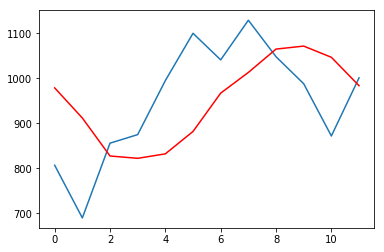

District: 9
Actuals: [740, 564, 805, 799, 899, 861, 947, 898, 946, 969, 812, 768]
Predictions: [852.3333333333334, 806.1333333333333, 711.8, 723.2666666666667, 743.6666666666666, 798.2666666666667, 831.4666666666667, 885.2666666666667, 897.2, 918.9333333333333, 938.5333333333333, 901.1333333333333]


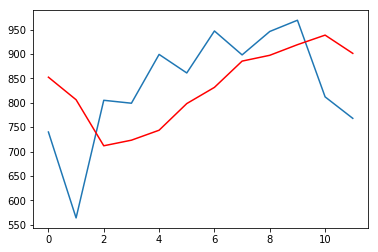

District: 10
Actuals: [1040, 791, 1179, 1327, 1520, 1259, 1323, 1418, 1192, 1209, 1034, 1026]
Predictions: [1113.0, 1067.7333333333333, 964.6666666666666, 1017.6666666666666, 1122.0, 1271.1333333333334, 1300.3333333333333, 1336.2666666666667, 1368.4, 1309.2666666666667, 1264.8, 1182.7333333333333]


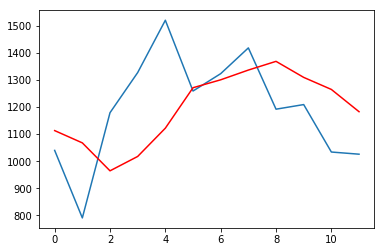

District: 11
Actuals: [948, 684, 917, 893, 986, 885, 1009, 1043, 895, 866, 767, 739]
Predictions: [812.9333333333333, 841.6, 788.6, 827.3333333333334, 854.6666666666666, 904.6, 904.4, 949.7333333333333, 984.7333333333333, 962.0, 929.4666666666667, 871.9333333333333]


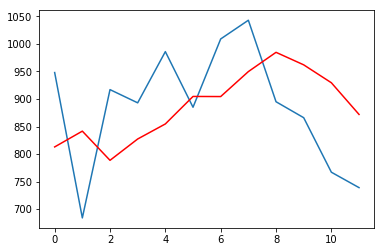

District: 12
Actuals: [644, 520, 647, 708, 725, 699, 751, 835, 831, 741, 656, 690]
Predictions: [719.6, 684.0666666666667, 619.9333333333333, 618.8666666666667, 644.4, 672.1333333333333, 688.8666666666667, 719.2666666666667, 762.2666666666667, 791.4, 782.3333333333334, 743.8666666666667]


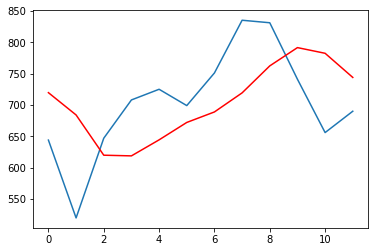

District: 13
Actuals: [1136, 970, 1290, 1273, 1333, 1327, 1381, 1350, 1358, 1261, 1194, 1200]
Predictions: [1241.6666666666667, 1196.1333333333334, 1109.5333333333333, 1155.4666666666667, 1193.8, 1246.8666666666666, 1289.0666666666666, 1336.5333333333333, 1346.2666666666667, 1354.6666666666667, 1325.0666666666666, 1277.9333333333334]


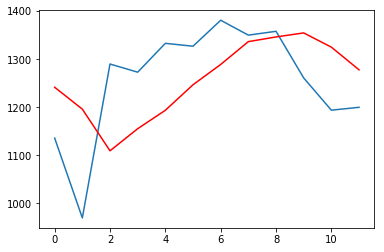

District: 14
Actuals: [749, 597, 827, 846, 922, 1031, 990, 1051, 1053, 978, 845, 875]
Predictions: [923.0666666666667, 852.6, 751.6, 757.6666666666666, 780.1333333333333, 827.8666666666667, 908.8, 957.2666666666667, 999.8666666666667, 1028.2, 1017.7333333333333, 959.2]


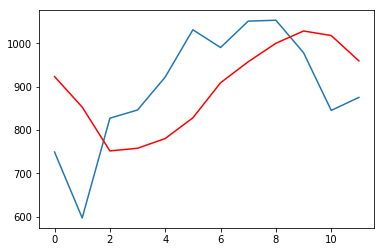

District: 15
Actuals: [311, 247, 304, 316, 347, 353, 355, 408, 379, 346, 301, 305]
Predictions: [328.8666666666667, 316.6, 289.46666666666664, 290.1333333333333, 297.6, 314.4, 330.4, 344.26666666666665, 368.6, 376.3333333333333, 368.8666666666667, 346.46666666666664]


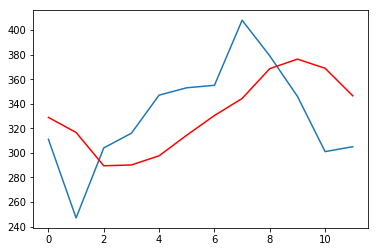

District: 16
Actuals: [882, 723, 920, 962, 1011, 959, 1030, 1043, 978, 903, 876, 764]
Predictions: [868.8, 858.5333333333333, 806.0, 836.1333333333333, 879.1333333333333, 932.7333333333333, 952.5333333333333, 990.8666666666667, 1013.0666666666667, 1005.4, 971.6666666666666, 936.1333333333333]


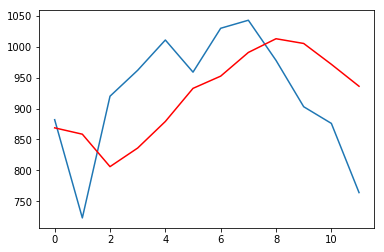

District: 17
Actuals: [929, 732, 981, 971, 1038, 1102, 1117, 1100, 1023, 984, 884, 875]
Predictions: [933.9333333333333, 919.2, 850.2, 883.6, 913.8666666666667, 960.6666666666666, 1017.9333333333333, 1068.6666666666667, 1088.0666666666666, 1073.8666666666666, 1043.2, 982.8]


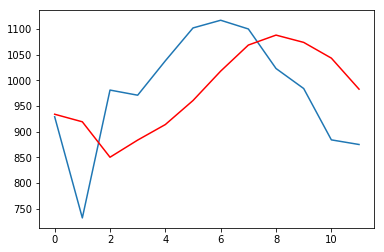

District: 18
Actuals: [666, 539, 660, 632, 685, 655, 707, 716, 660, 701, 563, 668]
Predictions: [648.7333333333333, 650.2, 612.6666666666666, 623.5333333333333, 627.8, 645.1333333333333, 651.3333333333334, 675.6, 691.6666666666666, 685.3333333333334, 690.8, 649.2]


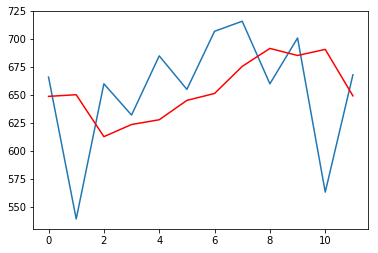

District: 19
Actuals: [817, 588, 817, 847, 845, 934, 1102, 1120, 955, 984, 886, 993]
Predictions: [966.0666666666667, 909.2, 796.2, 784.0, 792.9333333333333, 803.8, 854.2, 952.8, 1023.1333333333333, 1018.2666666666667, 1015.8666666666667, 971.5333333333333]


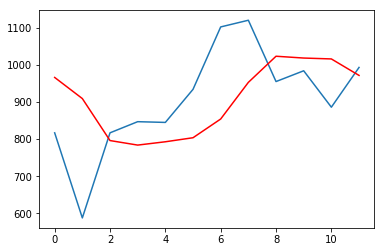

District: 20
Actuals: [758, 639, 932, 945, 1030, 953, 995, 1057, 969, 972, 864, 845]
Predictions: [906.1333333333333, 845.0, 764.1333333333333, 802.9333333333333, 848.7333333333333, 917.4666666666667, 948.2, 979.9333333333333, 1008.6, 999.6, 990.0, 948.2666666666667]


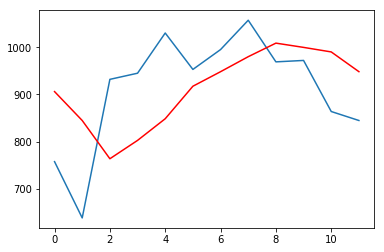

District: 21
Actuals: [762, 642, 768, 820, 937, 912, 1032, 1018, 866, 907, 903, 931]
Predictions: [915.8666666666667, 861.5333333333333, 784.2666666666667, 763.9333333333333, 770.2, 821.0, 863.0666666666667, 935.1333333333333, 976.5333333333333, 950.6, 935.2666666666667, 920.6]


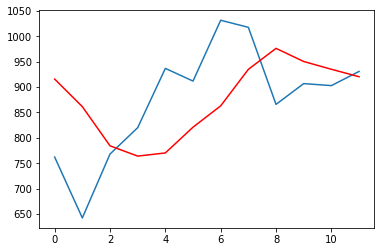

District: 22
Actuals: [586, 546, 604, 561, 666, 603, 581, 627, 648, 654, 558, 627]
Predictions: [616.8, 604.5333333333333, 581.6666666666666, 584.9333333333333, 577.2, 604.2666666666667, 607.7333333333333, 602.7333333333333, 610.7333333333333, 624.2, 633.8666666666667, 612.3333333333334]


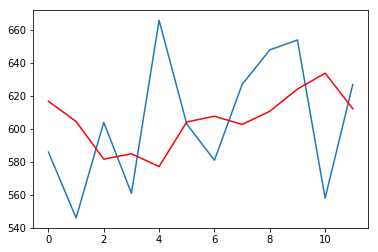

Test RMSE: 119.982


In [54]:
# prepare situation
window = 5
predTot = list()
testTot = list()
# walk forward over time steps in test
for distNum in range(len(train_d)):
    
    history = train_d[distNum]
    test = test_d[distNum]
    preds = []
    for t in range(len(test)):
        length = len(history)
        yhat = np.average([history[i] for i in range(length - window, length)], weights=[1,2,3,4,5])
        obs = test[t]
        preds.append(yhat)
        history.append(obs)
    
    print('District: {}'.format(distNum+1))
    print('Actuals: {}'.format(test))
    print('Predictions: {}'.format(preds))
    # plot
    plt.plot(test)
    plt.plot(preds, color='red')
    plt.show()
    
    testTot = testTot + test
    predTot = predTot + preds
error = mean_squared_error(predTot, testTot) ** .5
print('Test RMSE: %.3f' % error)

## Exponential Moving Average

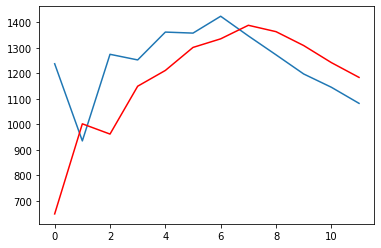

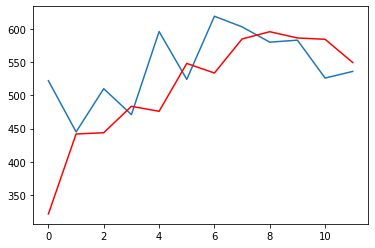

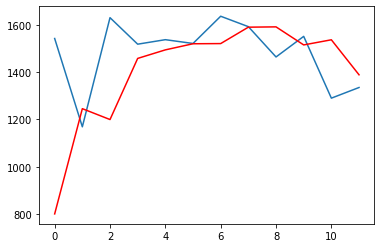

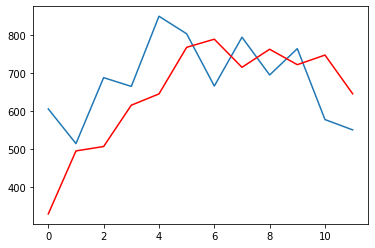

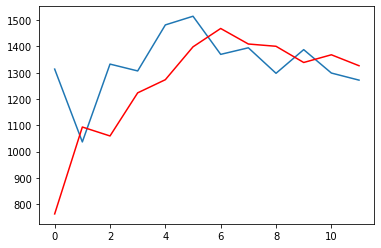

...

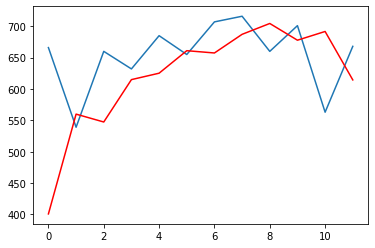

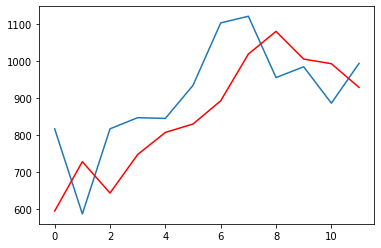

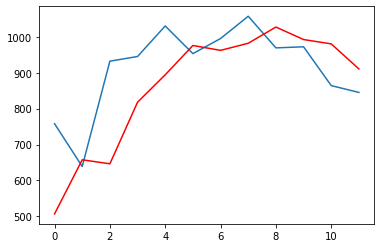

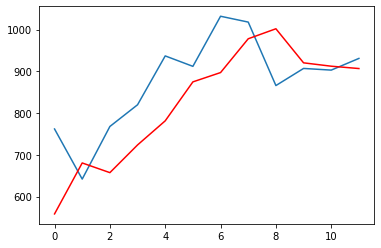

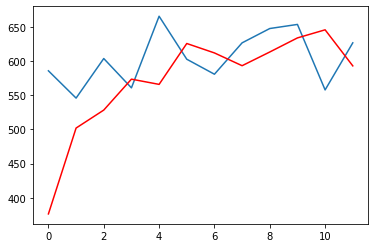

Test RMSE: 154.124


In [9]:
# prepare situation
predTot = list()
testTot = list()
alpha = 0.6
# walk forward over time steps in test
for distNum in range(len(train_d)):
    
    history = train_d[distNum]
    test = test_d[distNum]
    preds = []
    lastPred = 0
    for t in range(len(test)):
        yhat = ((1-alpha)*lastPred + (alpha*history[-1]))
        lastPred = yhat
        obs = test[t]
        preds.append(yhat)
        history.append(obs)
        
    # plot
    plt.plot(test)
    plt.plot(preds, color='red')
    plt.show()
    
    testTot = testTot + test
    predTot = predTot + preds
error = mean_squared_error(predTot, testTot) ** .5
print('Test RMSE: %.3f' % error)

## 1-layer LSTM based approach

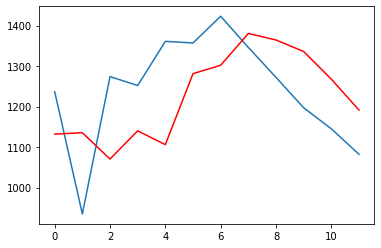

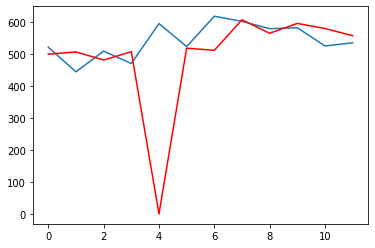

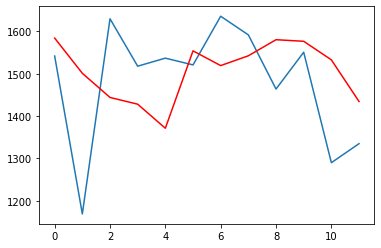

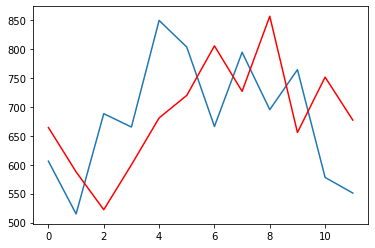

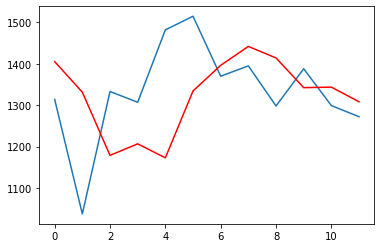

...

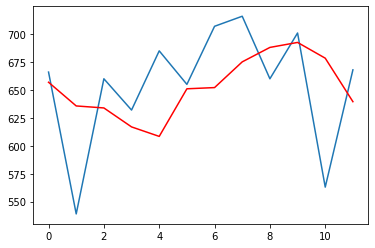

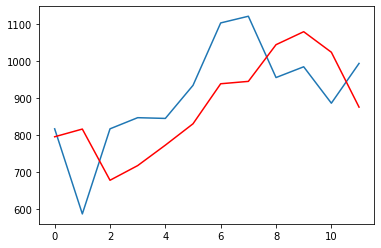

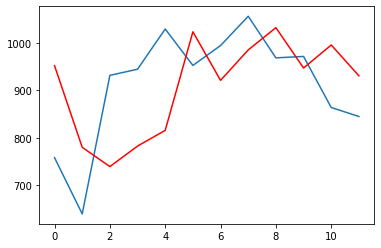

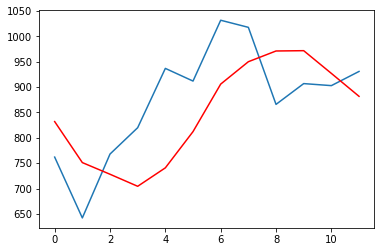

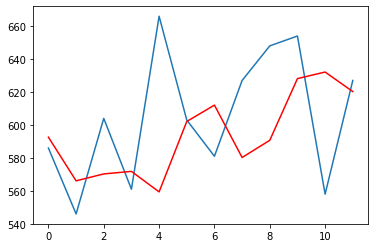

Test RMSE: 145.516


In [38]:
# prepare situation
window = 3
predTot = list()
testTot = list()

# walk forward over time steps in test
for distNum in tqdm_notebook(range(len(train_d))):
    
    history = train_d[distNum]
    test = test_d[distNum]
    preds = []
    for t in tqdm_notebook(range(len(test)), leave=False):
        
        length = len(history)
        
        # split into samples
        X, y = split_sequence(history, window)
        
        # reshape from [samples, timesteps] into [samples, timesteps, features]
        n_features = 1
        X = X.reshape((X.shape[0], X.shape[1], n_features))
        
        # define model
        model = Sequential()
        model.add(LSTM(50, activation='relu', input_shape=(window, n_features)))
        model.add(Dense(1))
        model.compile(optimizer='adam', loss='mse')
        
        # fit model
        model.fit(X, y, epochs=200, verbose=0)
        
        X_test = array([history[i] for i in range(length-window, length)])
        X_test = X_test.reshape((1, window, n_features))
        yhat = model.predict(X_test, verbose=0)
        
        obs = test[t]
        preds.append(yhat.reshape((1,)))
        history.append(obs)
        
    # plot
    plt.plot(test)
    plt.plot(preds, color='red')
    plt.show()
    
    testTot = testTot + test
    predTot = predTot + preds
error = mean_squared_error(predTot, testTot) ** .5
print('Test RMSE: %.3f' % error)

## Bidirectional LSTM Based approach

District: 1
Actuals: [1237, 935, 1274, 1252, 1361, 1357, 1423, 1346, 1272, 1197, 1145, 1082]
Predictions: [1064.0115, 1134.456, 1204.5393, 1340.748, 1098.9985, 1271.1199, 1339.083, 1358.8369, 1392.8442, 1241.6256, 1255.4276, 1144.5865]


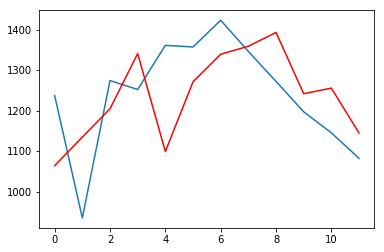

District: 2
Actuals: [522, 445, 510, 471, 596, 524, 619, 603, 580, 583, 526, 536]
Predictions: [499.93033, 519.0715, 498.5899, 509.6611, 521.3429, 537.6678, 576.5391, 590.21875, 601.2622, 561.74835, 560.534, 545.1077]


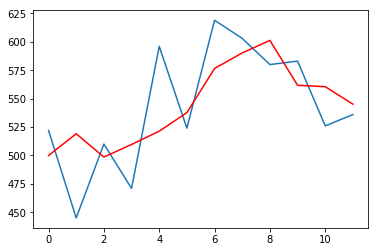

District: 3
Actuals: [1542, 1169, 1630, 1518, 1537, 1521, 1636, 1592, 1464, 1551, 1290, 1335]
Predictions: [1372.331, 1380.9373, 1347.147, 1448.5111, 1416.1696, 1526.9816, 1516.9626, 1566.9934, 1571.7844, 1585.185, 1534.581, 1336.9373]


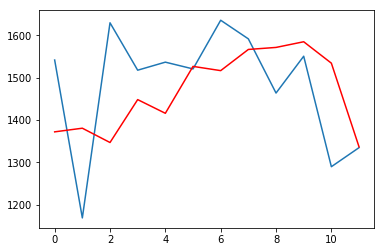

District: 4
Actuals: [606, 515, 688, 665, 849, 803, 666, 794, 695, 764, 578, 551]
Predictions: [576.8085, 592.3245, 516.19495, 624.4469, 648.2654, 870.38214, 811.88336, 702.2267, 710.69946, 681.93146, 714.50726, 609.5309]


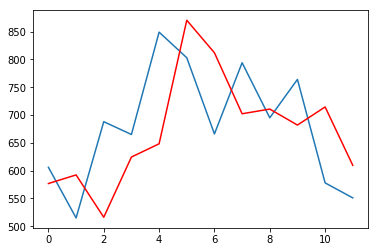

District: 5
Actuals: [1314, 1037, 1333, 1307, 1482, 1515, 1370, 1395, 1298, 1388, 1299, 1272]
Predictions: [1251.9773, 1242.306, 1178.2455, 1307.4271, 1378.0681, 1438.338, 1575.4434, 1429.3724, 1381.8715, 1332.6836, 1346.0361, 1291.547]


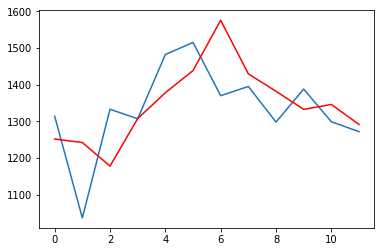

District: 6
Actuals: [986, 714, 1065, 1044, 1044, 1054, 1100, 1223, 1094, 997, 942, 983]
Predictions: [946.32056, 995.96716, 944.8473, 928.06744, 1102.6033, 1007.65576, 1000.143, 1010.12317, 1155.5532, 1078.8048, 1080.1237, 882.34106]


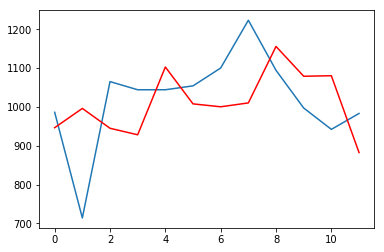

District: 7
Actuals: [1223, 916, 1220, 1159, 1283, 1158, 1311, 1272, 1148, 1251, 1105, 1073]
Predictions: [1130.5034, 1120.5657, 1101.1873, 1126.1682, 1195.2092, 1205.2974, 1179.4664, 1237.0319, 1296.0814, 1235.7135, 1185.7997, 1156.3871]


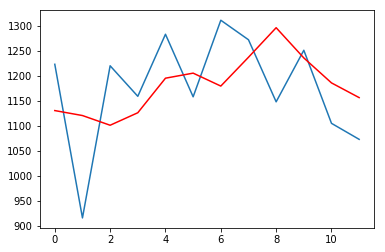

District: 8
Actuals: [807, 690, 856, 875, 995, 1100, 1041, 1129, 1048, 988, 872, 1001]
Predictions: [945.1329, 825.5197, 801.2255, 749.6329, 918.8357, 965.3762, 1097.4076, 1051.8896, 1163.6805, 1058.3427, 995.54645, 918.5557]


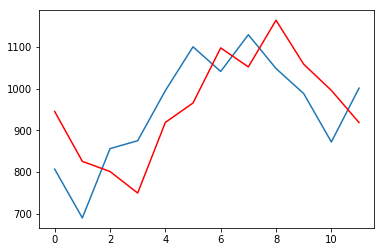

District: 9
Actuals: [740, 564, 805, 799, 899, 861, 947, 898, 946, 969, 812, 768]
Predictions: [782.0391, 720.9869, 642.229, 782.91785, 811.0791, 819.3807, 846.0109, 866.3175, 847.921, 957.7094, 882.0062, 867.9721]


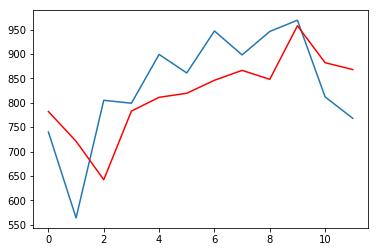

District: 10
Actuals: [1040, 791, 1179, 1327, 1520, 1259, 1323, 1418, 1192, 1209, 1034, 1026]
Predictions: [1040.8474, 999.4509, 921.74274, 990.92566, 1233.6063, 1349.0067, 1262.7559, 1305.5068, 1330.8079, 1258.7289, 1222.5614, 1090.2573]


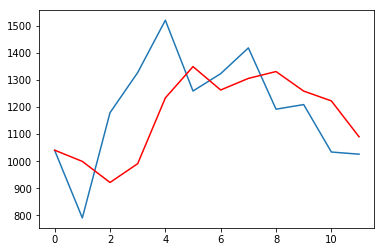

District: 11
Actuals: [948, 684, 917, 893, 986, 885, 1009, 1043, 895, 866, 767, 739]
Predictions: [753.07495, 874.1215, 820.9139, 881.2437, 865.7919, 880.9275, 925.6341, 943.5158, 1007.9647, 936.10364, 906.77, 792.21826]


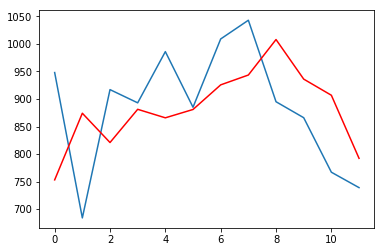

District: 12
Actuals: [644, 520, 647, 708, 725, 699, 751, 835, 831, 741, 656, 690]
Predictions: [689.8422, 614.99805, 562.09924, 663.33484, 689.47845, 734.0991, 657.4828, 746.7839, 831.0981, 800.72296, 729.8917, 676.914]


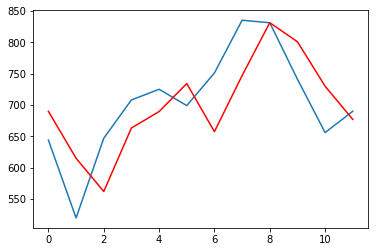

District: 13
Actuals: [1136, 970, 1290, 1273, 1333, 1327, 1381, 1350, 1358, 1261, 1194, 1200]
Predictions: [1214.3773, 1129.6838, 1035.2078, 1148.5881, 1302.4143, 1301.2378, 1296.8585, 1336.3138, 1337.821, 1301.5024, 1306.3022, 1203.8759]


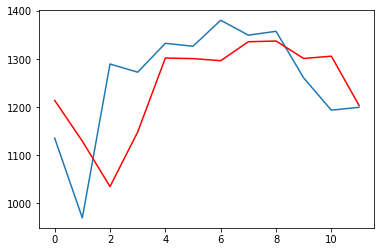

District: 14
Actuals: [749, 597, 827, 846, 922, 1031, 990, 1051, 1053, 978, 845, 875]
Predictions: [783.1889, 740.1352, 697.9699, 813.84607, 799.0256, 1027.8273, 1069.5992, 999.63794, 1026.2927, 1050.7404, 901.9544, 857.22687]


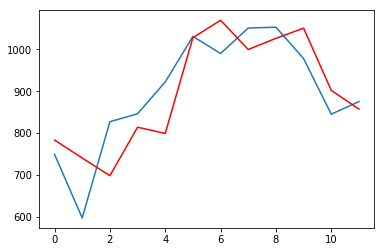

District: 15
Actuals: [311, 247, 304, 316, 347, 353, 355, 408, 379, 346, 301, 305]
Predictions: [277.28815, 324.44736, 283.74167, 305.46014, 342.28912, 341.42056, 351.11685, 360.2694, 398.56757, 389.4094, 337.184, 302.65546]


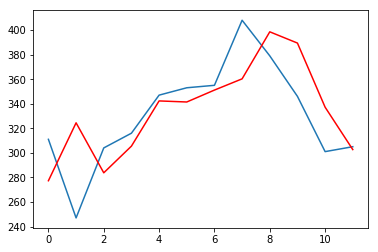

District: 16
Actuals: [882, 723, 920, 962, 1011, 959, 1030, 1043, 978, 903, 876, 764]
Predictions: [820.63556, 835.1594, 783.3632, 842.5431, 1025.9518, 946.64246, 937.6546, 994.3538, 1052.1774, 996.13104, 907.2693, 892.77747]


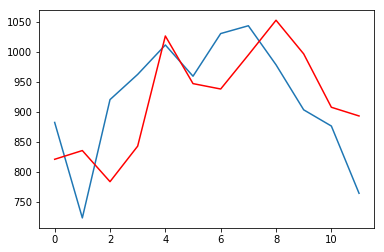

District: 17
Actuals: [929, 732, 981, 971, 1038, 1102, 1117, 1100, 1023, 984, 884, 875]
Predictions: [865.5842, 920.33215, 970.52155, 993.78467, 918.31934, 966.7984, 1082.1309, 1157.995, 1060.4863, 993.6315, 966.87616, 940.72705]


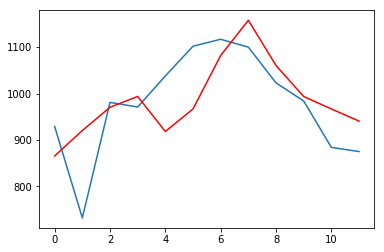

District: 18
Actuals: [666, 539, 660, 632, 685, 655, 707, 716, 660, 701, 563, 668]
Predictions: [655.5131, 655.6981, 607.6047, 644.80707, 622.0998, 675.12775, 646.20404, 723.808, 693.23474, 686.1358, 686.92334, 653.5819]


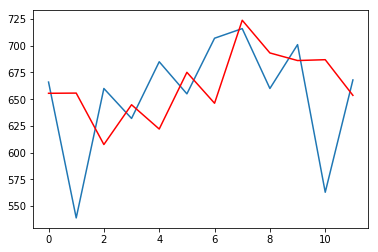

District: 19
Actuals: [817, 588, 817, 847, 845, 934, 1102, 1120, 955, 984, 886, 993]
Predictions: [901.7136, 889.2682, 703.90985, 697.8584, 788.49927, 921.90265, 911.80066, 1104.5322, 1149.6321, 972.2028, 943.0761, 892.5125]


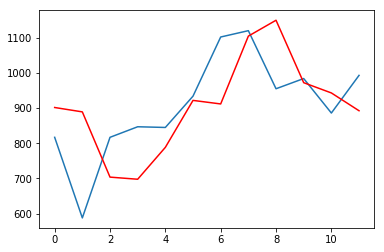

District: 20
Actuals: [758, 639, 932, 945, 1030, 953, 995, 1057, 969, 972, 864, 845]
Predictions: [845.8844, 770.67474, 701.9236, 866.37854, 989.5177, 978.6826, 926.8059, 943.4695, 977.3843, 965.25653, 954.05005, 870.6763]


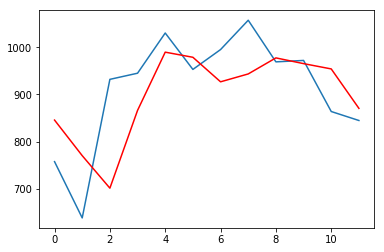

District: 21
Actuals: [762, 642, 768, 820, 937, 912, 1032, 1018, 866, 907, 903, 931]
Predictions: [870.0789, 810.99176, 732.1431, 775.3026, 841.2435, 922.0625, 955.83954, 1026.6659, 1003.8136, 881.66656, 905.4393, 866.56934]


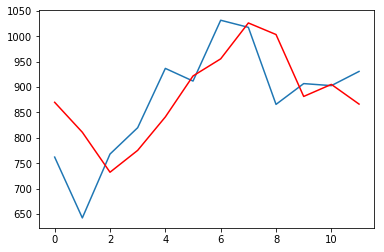

District: 22
Actuals: [586, 546, 604, 561, 666, 603, 581, 627, 648, 654, 558, 627]
Predictions: [587.3595, 585.4916, 568.2721, 573.74713, 566.8799, 598.06415, 640.49286, 599.50446, 601.1335, 635.1118, 631.5652, 606.3138]


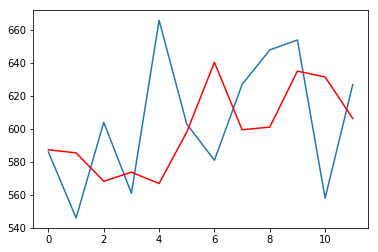


Test RMSE: 103.225


In [56]:
# prepare situation
window = 3
predTot = list()
testTot = list()

# walk forward over time steps in test
for distNum in tqdm_notebook(range(len(train_d))):
    
    history = train_d[distNum]
    test = test_d[distNum]
    preds = []
    for t in tqdm_notebook(range(len(test)), leave=False):
        
        length = len(history)
        
        # split into samples
        X, y = split_sequence(history, window)
        
        # reshape from [samples, timesteps] into [samples, timesteps, features]
        n_features = 1
        X = X.reshape((X.shape[0], X.shape[1], n_features))
        
        model = Sequential()
        model.add(Bidirectional(LSTM(50, activation='relu'), input_shape=(window, n_features)))
        model.add(Dense(1))
        model.compile(optimizer='adam', loss='mse')
        
        # fit model
        model.fit(X, y, epochs=200, verbose=0)
        
        X_test = array([history[i] for i in range(length-window, length)])
        X_test = X_test.reshape((1, window, n_features))
        yhat = model.predict(X_test, verbose=0)
        
        obs = test[t]
        preds.append(yhat.reshape((1,)))
        history.append(obs)
    
    preds_new = [i[0] for i in preds]
    print('District: {}'.format(distNum+1))
    print('Actuals: {}'.format(test))
    print('Predictions: {}'.format(preds_new))
    
    # plot
    plt.plot(test)
    plt.plot(preds_new, color='red')
    plt.show()
    
    testTot = testTot + test
    predTot = predTot + preds_new
error = mean_squared_error(predTot, testTot) ** .5
print('Test RMSE: %.3f' % error)

## CNN - LSTM based approach

District: 1
Actuals: [1237, 935, 1274, 1252, 1361, 1357, 1423, 1346, 1272, 1197, 1145, 1082]
Predictions: [1049.2345, 1181.0776, 1168.6636, 1232.9573, 1230.837, 1360.4248, 1334.8773, 1353.4144, 1368.5873, 1295.06, 1231.9653, 1104.4772]


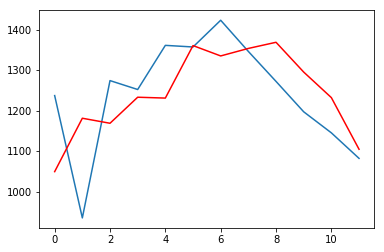

District: 2
Actuals: [522, 445, 510, 471, 596, 524, 619, 603, 580, 583, 526, 536]
Predictions: [506.10223, 487.0779, 504.17654, 479.2906, 482.9173, 555.1091, 572.4011, 585.4717, 590.2342, 564.54425, 553.90216, 552.9935]


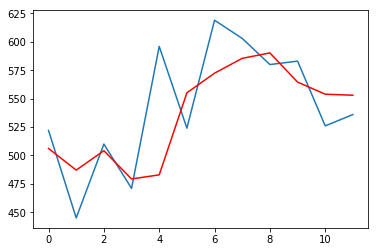

District: 3
Actuals: [1542, 1169, 1630, 1518, 1537, 1521, 1636, 1592, 1464, 1551, 1290, 1335]
Predictions: [1355.418, 1478.546, 1396.9125, 1537.7246, 1526.1926, 1551.4948, 1455.2385, 1533.9346, 1528.5919, 1550.2917, 1524.7456, 1497.6746]


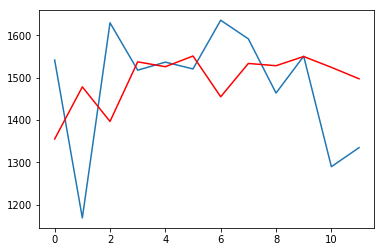

District: 4
Actuals: [606, 515, 688, 665, 849, 803, 666, 794, 695, 764, 578, 551]
Predictions: [579.5275, 583.60284, 582.34735, 678.2526, 680.01715, 798.4651, 771.2592, 774.7632, 745.866, 756.265, 710.42865, 683.20935]


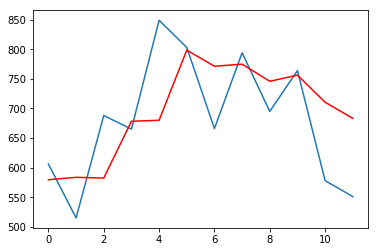

District: 5
Actuals: [1314, 1037, 1333, 1307, 1482, 1515, 1370, 1395, 1298, 1388, 1299, 1272]
Predictions: [1268.7532, 1275.6227, 1270.6244, 1263.3325, 1260.0481, 1406.6334, 1414.0223, 1401.8801, 1350.8197, 1311.4246, 1327.9144, 1321.3489]


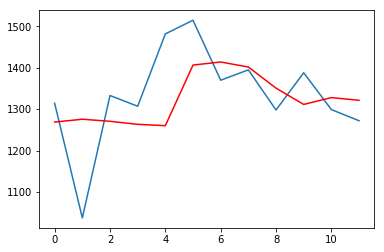

District: 6
Actuals: [986, 714, 1065, 1044, 1044, 1054, 1100, 1223, 1094, 997, 942, 983]
Predictions: [914.96875, 897.68445, 941.0196, 1010.0688, 1006.9694, 1001.9788, 1020.024, 1022.1349, 1159.6726, 1170.5098, 1025.1965, 915.44055]


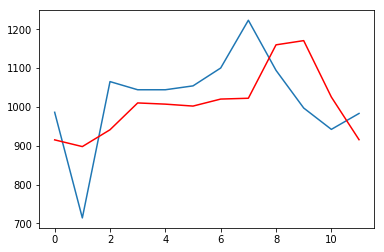

District: 7
Actuals: [1223, 916, 1220, 1159, 1283, 1158, 1311, 1272, 1148, 1251, 1105, 1073]
Predictions: [1095.4888, 1173.5264, 1111.9137, 1155.6622, 1158.3002, 1208.0607, 1177.1539, 1241.2269, 1185.3341, 1213.2177, 1189.5165, 1207.0265]


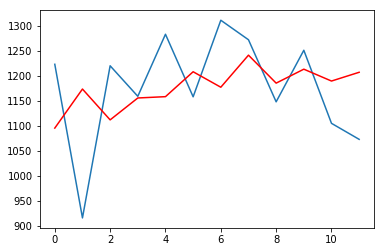

District: 8
Actuals: [807, 690, 856, 875, 995, 1100, 1041, 1129, 1048, 988, 872, 1001]
Predictions: [901.4182, 946.7036, 804.39636, 824.0765, 800.2831, 977.2854, 1094.2266, 1064.1604, 1084.9716, 1059.499, 976.15204, 975.899]


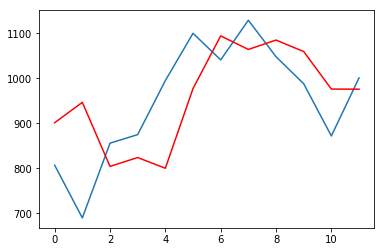

District: 9
Actuals: [740, 564, 805, 799, 899, 861, 947, 898, 946, 969, 812, 768]
Predictions: [784.13794, 751.9436, 744.28125, 770.2398, 794.1419, 844.9486, 898.9419, 930.1653, 908.0374, 881.17145, 944.0495, 918.0232]


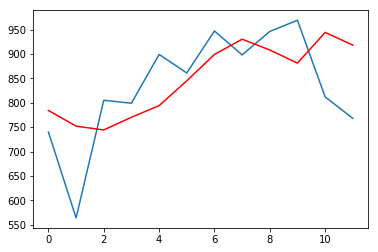

District: 10
Actuals: [1040, 791, 1179, 1327, 1520, 1259, 1323, 1418, 1192, 1209, 1034, 1026]
Predictions: [937.39185, 948.442, 1022.9385, 1119.5854, 1284.7106, 1431.1594, 1436.024, 1213.8713, 1319.2693, 1313.5596, 1116.6376, 1097.798]


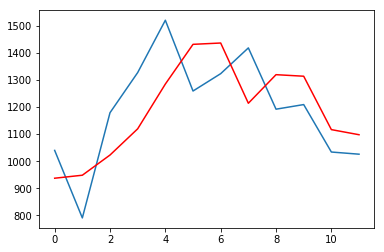

District: 11
Actuals: [948, 684, 917, 893, 986, 885, 1009, 1043, 895, 866, 767, 739]
Predictions: [722.5331, 903.19495, 882.3525, 875.9982, 869.924, 920.31934, 939.22974, 968.7152, 972.3985, 993.6965, 846.25824, 829.4058]


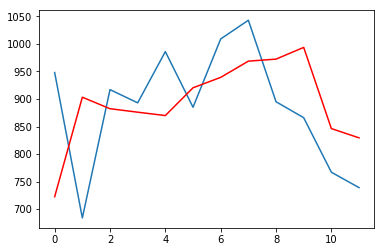

District: 12
Actuals: [644, 520, 647, 708, 725, 699, 751, 835, 831, 741, 656, 690]
Predictions: [640.63794, 666.87476, 572.32263, 602.5594, 697.05084, 662.3386, 684.2071, 715.51306, 814.1146, 792.76465, 792.7322, 686.48816]


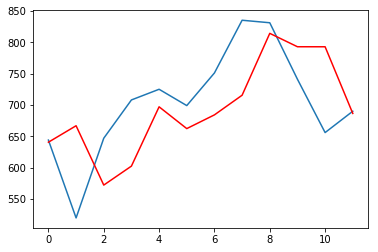

District: 13
Actuals: [1136, 970, 1290, 1273, 1333, 1327, 1381, 1350, 1358, 1261, 1194, 1200]
Predictions: [1136.6293, 1181.047, 1098.3457, 1229.2753, 1173.2542, 1259.2579, 1272.0004, 1317.7441, 1363.2974, 1305.4149, 1323.9281, 1214.622]


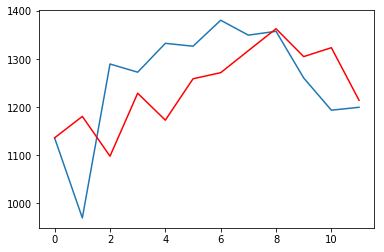

District: 15
Actuals: [311, 247, 304, 316, 347, 353, 355, 408, 379, 346, 301, 305]
Predictions: [286.65552, 281.20096, 305.00537, 301.35052, 311.53278, 310.47864, 333.04968, 352.7234, 380.9813, 380.16263, 352.83383, 335.17584]


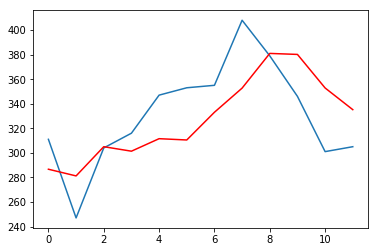

District: 16
Actuals: [882, 723, 920, 962, 1011, 959, 1030, 1043, 978, 903, 876, 764]
Predictions: [814.3116, 834.73535, 828.76013, 855.0769, 892.46747, 935.98065, 953.10724, 968.441, 1013.1291, 994.00555, 930.9288, 839.73505]


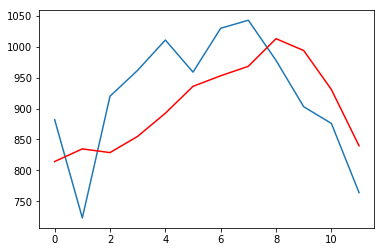

District: 17
Actuals: [929, 732, 981, 971, 1038, 1102, 1117, 1100, 1023, 984, 884, 875]
Predictions: [820.16516, 827.9327, 905.55884, 960.87103, 962.327, 1002.0106, 1026.0758, 1087.9406, 1062.6287, 1053.8362, 960.2462, 960.97687]


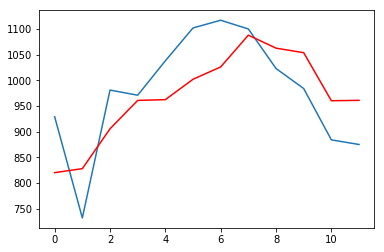

District: 18
Actuals: [666, 539, 660, 632, 685, 655, 707, 716, 660, 701, 563, 668]
Predictions: [636.4365, 608.45105, 642.3091, 625.39355, 619.96906, 621.0816, 631.9238, 668.60504, 670.22687, 676.19574, 672.00555, 669.9936]


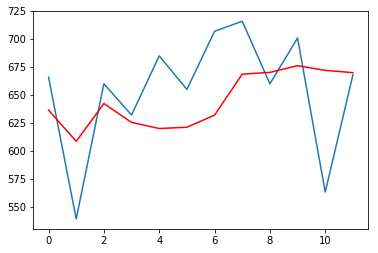

District: 19
Actuals: [817, 588, 817, 847, 845, 934, 1102, 1120, 955, 984, 886, 993]
Predictions: [940.1847, 934.7349, 799.45715, 793.984, 795.679, 789.00415, 882.5321, 1031.1902, 1041.0394, 1046.5648, 927.33716, 926.01294]


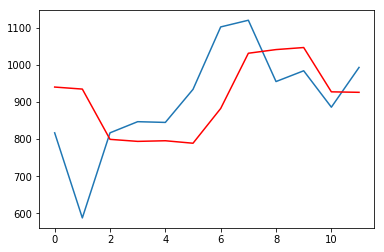

District: 20
Actuals: [758, 639, 932, 945, 1030, 953, 995, 1057, 969, 972, 864, 845]
Predictions: [816.368, 801.86444, 724.9163, 905.7872, 869.6714, 974.20966, 1012.19183, 930.0095, 1010.7598, 1004.6139, 909.0694, 942.6359]


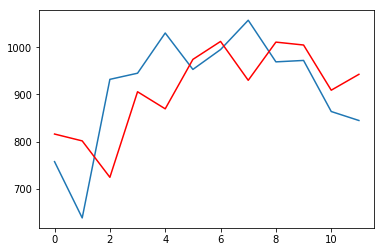

District: 21
Actuals: [762, 642, 768, 820, 937, 912, 1032, 1018, 866, 907, 903, 931]
Predictions: [820.8044, 810.7178, 721.8615, 742.40845, 780.3093, 890.71924, 893.95514, 1012.16895, 979.19214, 960.8603, 860.7358, 857.4642]


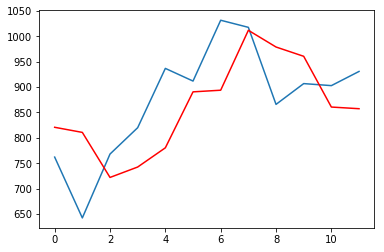

District: 22
Actuals: [586, 546, 604, 561, 666, 603, 581, 627, 648, 654, 558, 627]
Predictions: [611.19867, 605.3118, 577.54913, 579.5342, 564.4421, 603.0129, 609.6661, 572.55536, 597.70557, 605.7417, 608.3365, 613.9909]


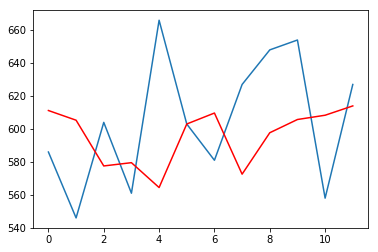


Test RMSE: 103.097


In [61]:
# prepare situation
window = 4
predTot = list()
testTot = list()

# walk forward over time steps in test
for distNum in tqdm_notebook(range(len(train_d))):
    
    history = train_d[distNum]
    test = test_d[distNum]
    preds = []
    for t in tqdm_notebook(range(len(test)), leave=False):
        
        length = len(history)
        
        # split into samples
        X, y = split_sequence(history, window)
        
        # reshape from [samples, timesteps] into [samples, subsequences, timesteps, features]
        n_features = 1
        n_seq = 2
        n_steps = 2
        X = X.reshape((X.shape[0], n_seq, n_steps, n_features))
        
        model = Sequential()
        model.add(TimeDistributed(Conv1D(filters=64, kernel_size=1, activation='relu'), input_shape=(None, n_steps, n_features)))
        model.add(TimeDistributed(MaxPooling1D(pool_size=2)))
        model.add(TimeDistributed(Flatten()))
        model.add(LSTM(50, activation='relu'))
        model.add(Dense(1))
        model.compile(optimizer='adam', loss='mse')
        
        # fit model
        model.fit(X, y, epochs=500, verbose=0)
        
        X_test = array([history[i] for i in range(length-window, length)])
        X_test = X_test.reshape((1, n_seq, n_steps, n_features))
        yhat = model.predict(X_test, verbose=0)
        
        obs = test[t]
        preds.append(yhat.reshape((1,)))
        history.append(obs)
    
    preds_new = [i[0] for i in preds]
    print('District: {}'.format(distNum+1))
    print('Actuals: {}'.format(test))
    print('Predictions: {}'.format(preds_new))
    
    # plot
    plt.plot(test)
    plt.plot(preds_new, color='red')
    plt.show()
    
    testTot = testTot + test
    predTot = predTot + preds_new
error = mean_squared_error(predTot, testTot) ** .5
print('Test RMSE: %.3f' % error)

# District wise predictions for a week

In [10]:
data_tr = data.loc['2011-01-01':'2014-12-31']
data_test = data.loc['2015-01-01':'2015-12-31']

In [11]:
listOfDist = list(data['District'].unique())

In [12]:
train_d = []
for district in listOfDist:
    df = data_tr[data_tr['District'] == district]
    df_gr = df.groupby(['Year', 'weekOfYear']).count()
    train_d.append(list(df_gr['Date'].values))

In [13]:
test_d = []
for district in listOfDist:
    df = data_test[data_test['District'] == district]
    df_gr = df.groupby(['weekOfYear']).count()
    test_d.append(list(df_gr['Date'].values))

## Simple Moving Average

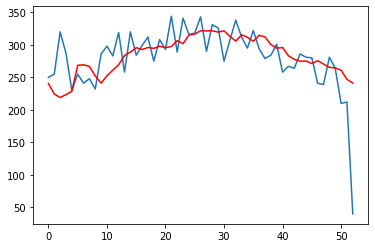

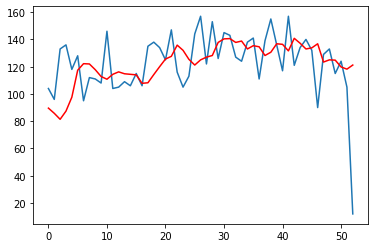

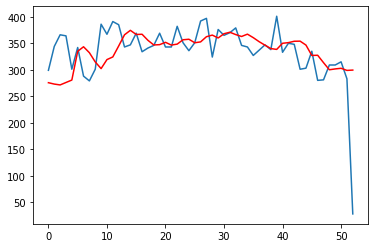

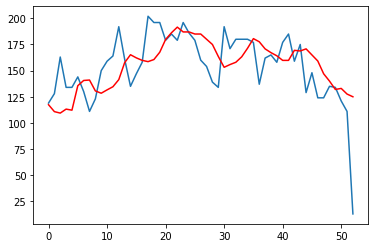

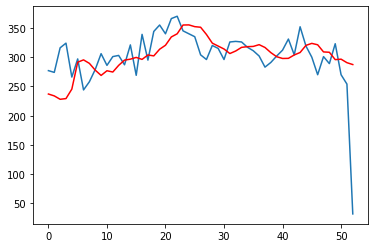

...

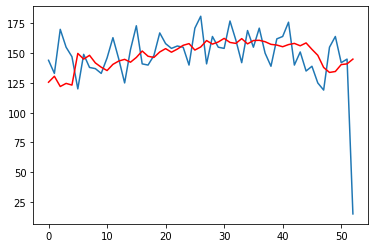

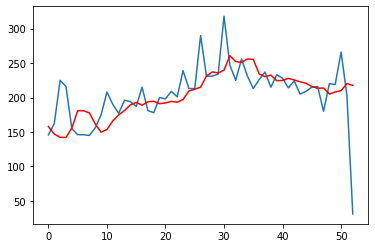

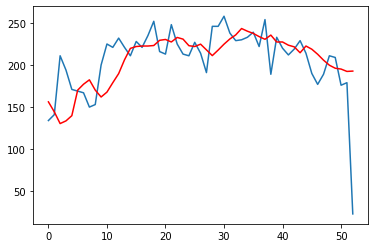

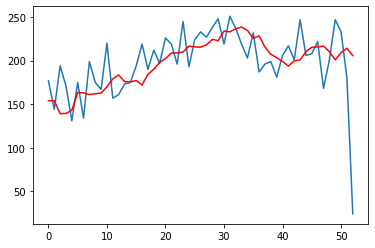

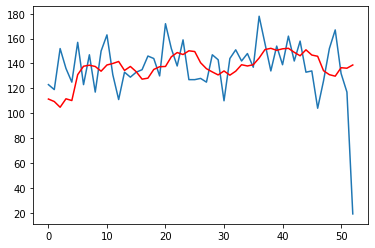

Test RMSE: 36.017


In [14]:
# prepare situation
window = 5
predTot = list()
testTot = list()
# walk forward over time steps in test
for distNum in range(len(train_d)):
    
    history = train_d[distNum]
    test = test_d[distNum]
    preds = []
    for t in range(len(test)):
        length = len(history)
        yhat = mean([history[i] for i in range(length - window, length)])
        obs = test[t]
        preds.append(yhat)
        history.append(obs)
        
    # plot
    plt.plot(test)
    plt.plot(preds, color='red')
    plt.show()
    
    testTot = testTot + test
    predTot = predTot + preds
error = mean_squared_error(predTot, testTot) ** .5
print('Test RMSE: %.3f' % error)

## Weighted Moving Average

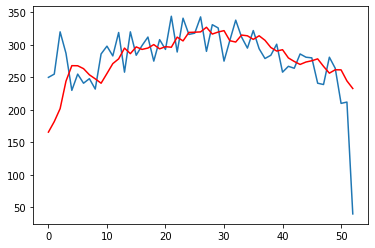

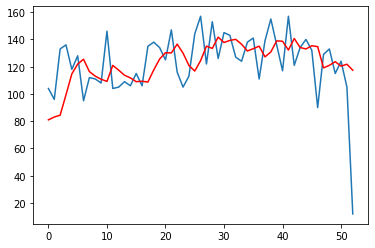

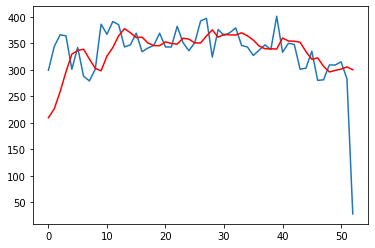

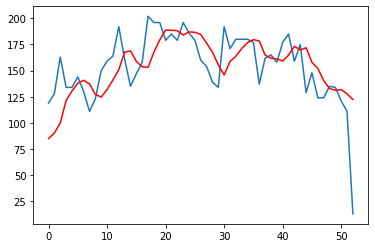

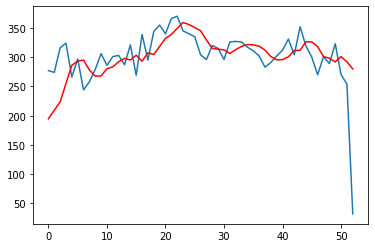

...

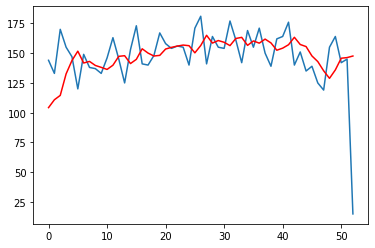

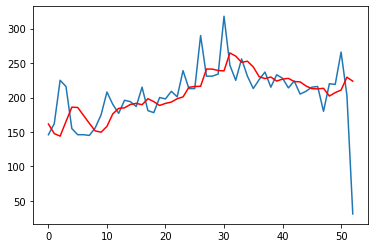

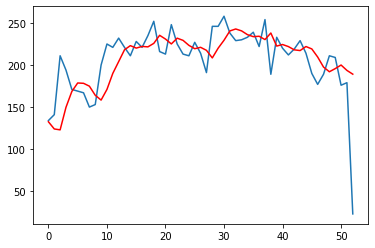

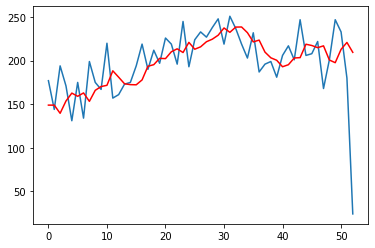

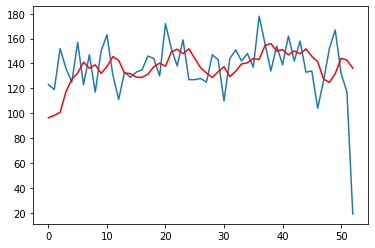

Test RMSE: 36.397


In [15]:
# prepare situation
window = 5
predTot = list()
testTot = list()
# walk forward over time steps in test
for distNum in range(len(train_d)):
    
    history = train_d[distNum]
    test = test_d[distNum]
    preds = []
    for t in range(len(test)):
        length = len(history)
        yhat = np.average([history[i] for i in range(length - window, length)], weights=[1,2,3,4,5])
        obs = test[t]
        preds.append(yhat)
        history.append(obs)
        
    # plot
    plt.plot(test)
    plt.plot(preds, color='red')
    plt.show()
    
    testTot = testTot + test
    predTot = predTot + preds
error = mean_squared_error(predTot, testTot) ** .5
print('Test RMSE: %.3f' % error)

## Exponential moving average

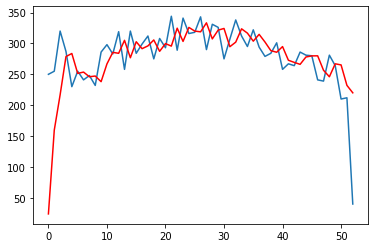

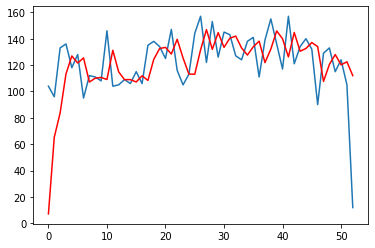

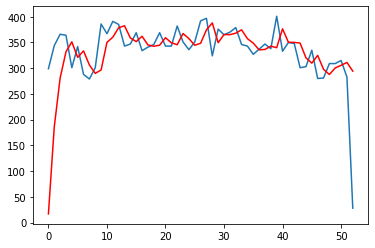

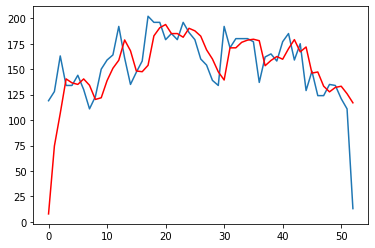

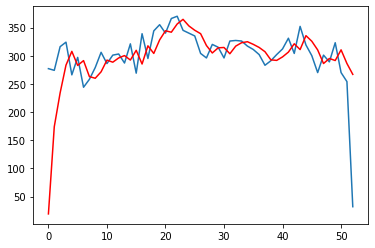

...

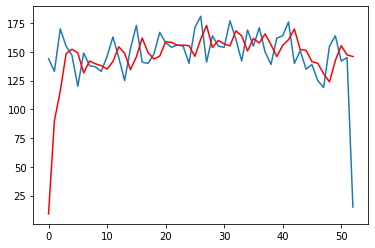

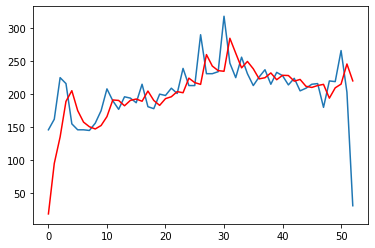

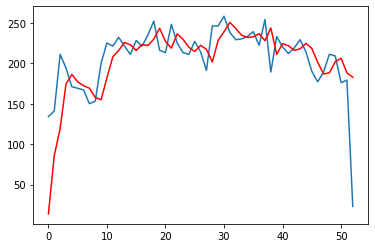

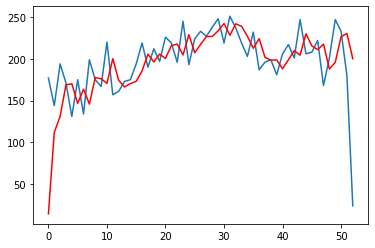

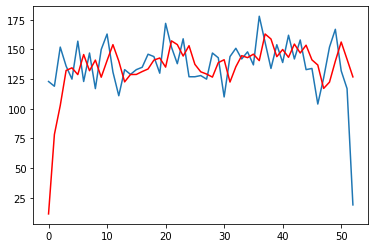

Test RMSE: 42.618


In [16]:
# prepare situation
predTot = list()
testTot = list()
alpha = 0.6
# walk forward over time steps in test
for distNum in range(len(train_d)):
    
    history = train_d[distNum]
    test = test_d[distNum]
    preds = []
    lastPred = 0
    for t in range(len(test)):
        yhat = ((1-alpha)*lastPred + (alpha*history[-1]))
        lastPred = yhat
        obs = test[t]
        preds.append(yhat)
        history.append(obs)
        
    # plot
    plt.plot(test)
    plt.plot(preds, color='red')
    plt.show()
    
    testTot = testTot + test
    predTot = predTot + preds
error = mean_squared_error(predTot, testTot) ** .5
print('Test RMSE: %.3f' % error)

# District wise predictions for a day

In [17]:
data_tr = data.loc['2011-01-01':'2014-12-31']
data_test = data.loc['2015-01-01':'2015-12-31']

In [18]:
listOfDist = list(data['District'].unique())

In [19]:
train_d = []
for district in listOfDist:
    df = data_tr[data_tr['District'] == district]
    df_gr = df.groupby(['Year', 'dayOfYear']).count()
    train_d.append(list(df_gr['Date'].values))

In [20]:
test_d = []
for district in listOfDist:
    df = data_test[data_test['District'] == district]
    df_gr = df.groupby(['dayOfYear']).count()
    test_d.append(list(df_gr['Date'].values))

## Simple Moving Average

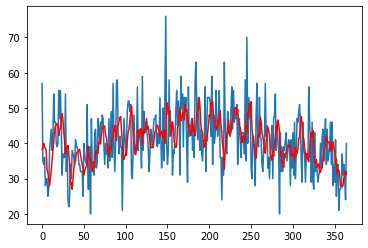

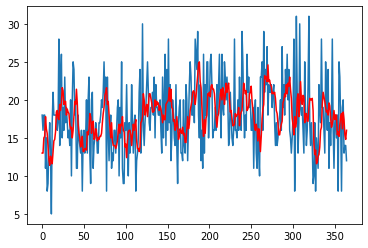

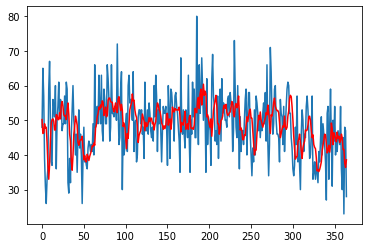

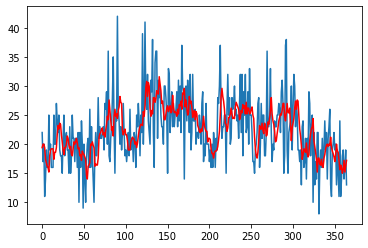

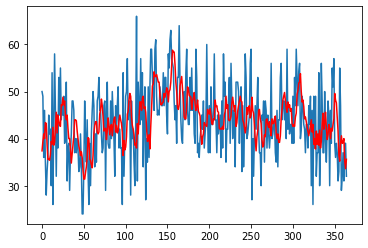

...

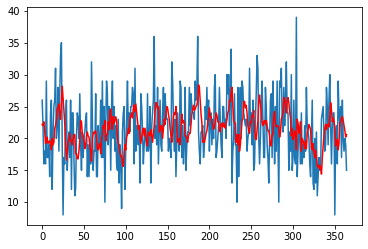

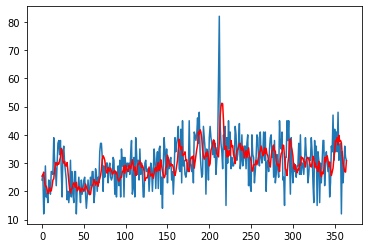

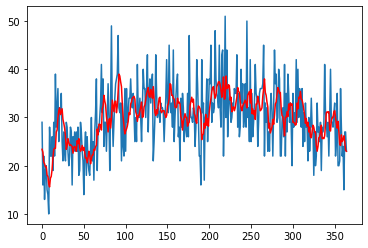

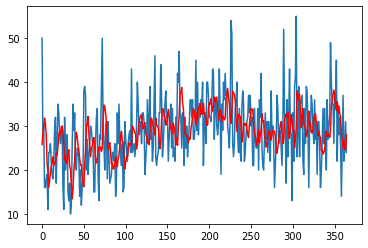

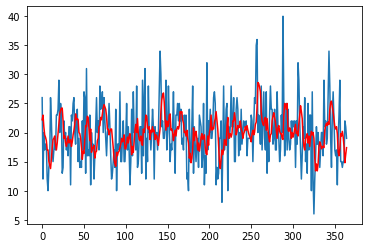

Test RMSE: 7.129


In [21]:
# prepare situation
window = 5
predTot = list()
testTot = list()
# walk forward over time steps in test
for distNum in range(len(train_d)):
    
    history = train_d[distNum]
    test = test_d[distNum]
    preds = []
    for t in range(len(test)):
        length = len(history)
        yhat = mean([history[i] for i in range(length - window, length)])
        obs = test[t]
        preds.append(yhat)
        history.append(obs)
        
    # plot
    plt.plot(test)
    plt.plot(preds, color='red')
    plt.show()
    
    testTot = testTot + test
    predTot = predTot + preds
error = mean_squared_error(predTot, testTot) ** .5
print('Test RMSE: %.3f' % error)

## Weighted Moving Average

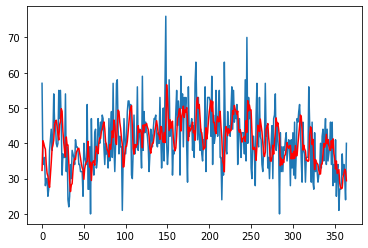

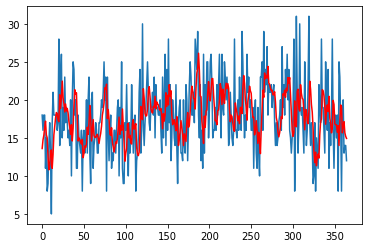

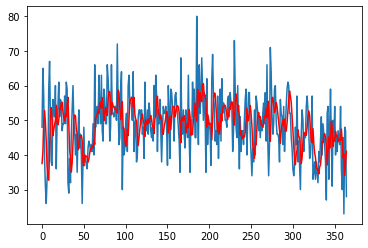

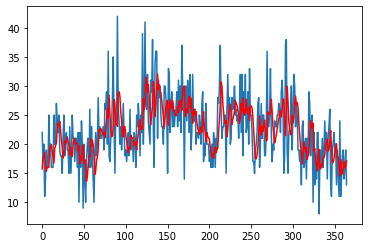

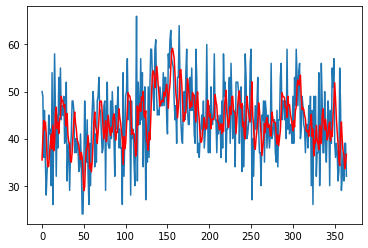

...

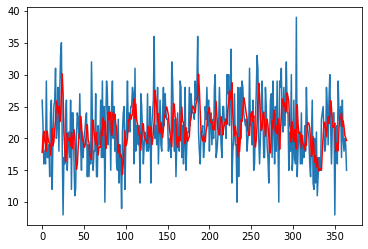

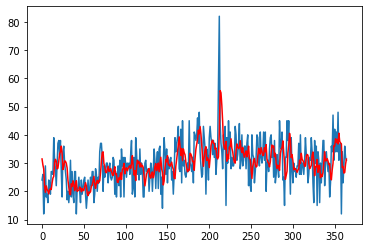

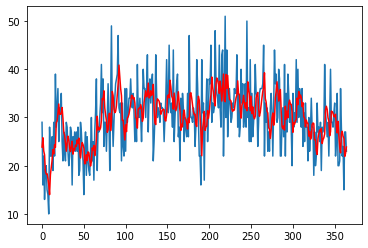

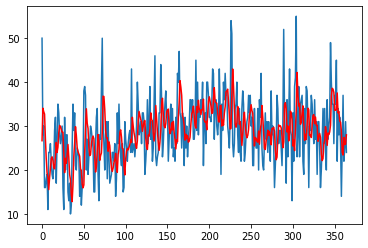

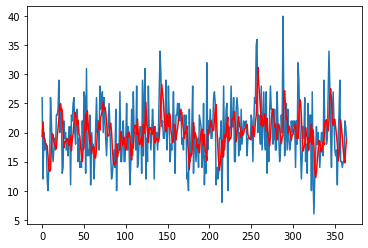

Test MSE: 7.166


In [22]:
# prepare situation
window = 5
predTot = list()
testTot = list()
# walk forward over time steps in test
for distNum in range(len(train_d)):
    
    history = train_d[distNum]
    test = test_d[distNum]
    preds = []
    for t in range(len(test)):
        length = len(history)
        yhat = np.average([history[i] for i in range(length - window, length)], weights=[1,2,3,4,5])
        obs = test[t]
        preds.append(yhat)
        history.append(obs)
        
    # plot
    plt.plot(test)
    plt.plot(preds, color='red')
    plt.show()
    
    testTot = testTot + test
    predTot = predTot + preds
error = mean_squared_error(predTot, testTot) ** .5
print('Test MSE: %.3f' % error)

## Exponential Moving average

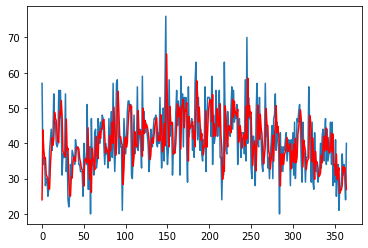

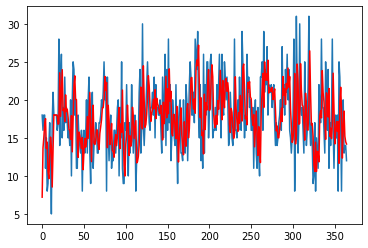

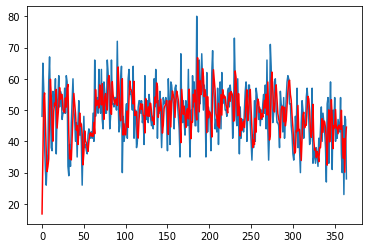

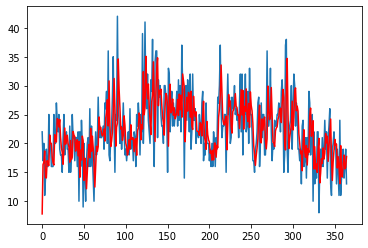

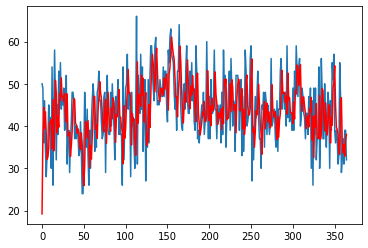

...

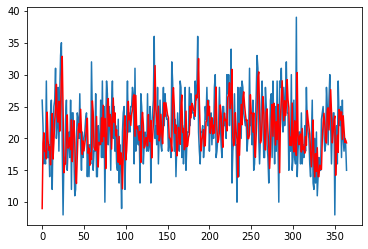

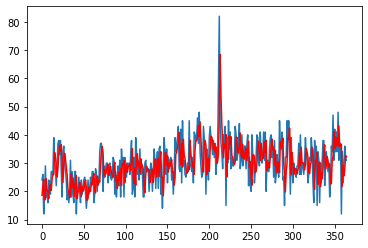

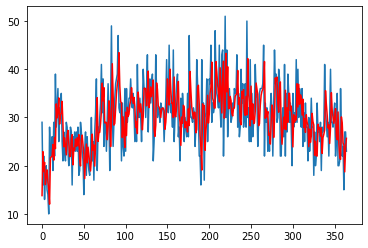

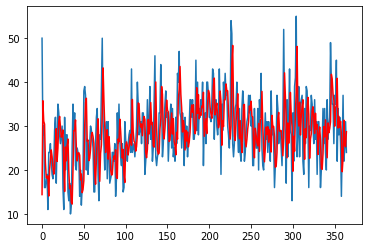

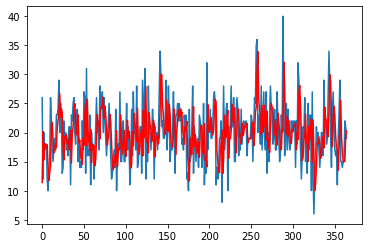

Test RMSE: 7.566


In [23]:
# prepare situation
predTot = list()
testTot = list()
alpha = 0.6
# walk forward over time steps in test
for distNum in range(len(train_d)):
    
    history = train_d[distNum]
    test = test_d[distNum]
    preds = []
    lastPred = 0
    for t in range(len(test)):
        yhat = ((1-alpha)*lastPred + (alpha*history[-1]))
        lastPred = yhat
        obs = test[t]
        preds.append(yhat)
        history.append(obs)
        
    # plot
    plt.plot(test)
    plt.plot(preds, color='red')
    plt.show()
    
    testTot = testTot + test
    predTot = predTot + preds
error = mean_squared_error(predTot, testTot) ** .5
print('Test RMSE: %.3f' % error)

# Conclusions

In [62]:
x = PrettyTable()

x.field_names = ['Window', 'Method', 'Test RMSE']

x.add_row(['Month', 'Simple moving avg', '135.942'])
x.add_row(['Month', 'Weighted moving avg', '119.982'])
x.add_row(['Month', 'Exponential moving avg', '154.124'])
x.add_row(['Month', '1-layer LSTM', '145.516'])
x.add_row(['Month', 'Bidirectional LSTM', '103.225'])
x.add_row(['Month', 'CNN LSTM', '103.097'])

x.add_row(['Week', 'Simple moving avg', '36.017'])
x.add_row(['Week', 'Weighted moving avg', '36.397'])
x.add_row(['Week', 'Exponential moving avg', '42.618'])

x.add_row(['Day', 'Simple moving avg', '7.129'])
x.add_row(['Day', 'Weighted moving avg', '7.166'])
x.add_row(['Day', 'Exponential moving avg', '7.565'])

print(x)

+--------+------------------------+-----------+
| Window |         Method         | Test RMSE |
+--------+------------------------+-----------+
| Month  |   Simple moving avg    |  135.942  |
| Month  |  Weighted moving avg   |  119.982  |
| Month  | Exponential moving avg |  154.124  |
| Month  |      1-layer LSTM      |  145.516  |
| Month  |   Bidirectional LSTM   |  103.225  |
| Month  |        CNN LSTM        |  103.097  |
|  Week  |   Simple moving avg    |   36.017  |
|  Week  |  Weighted moving avg   |   36.397  |
|  Week  | Exponential moving avg |   42.618  |
|  Day   |   Simple moving avg    |   7.129   |
|  Day   |  Weighted moving avg   |   7.166   |
|  Day   | Exponential moving avg |   7.565   |
+--------+------------------------+-----------+


- RMSE scores are good
- We are not able to model year end dip in crime numbers when considered week-wise predictions
- This problem is smoothen out in day-wise predictions and RMSEs have improved drastically from week to day-wise
- We'll try one more method to model year end dip in week-wise predictions in next notebook
- LSTM based approaches surely showed an improved in comparision to simple naive approaches.

# Predictions for day and night

- For each crime record, we'll assign a label to it whether that crime occured in day (6am-6pm) or night(6pm-6am)
- Than for each <b>community</b>, we'll predict crime numbers on a daily basis. First for all the day crimes and than for all the night crimes. 
- We'll showcase only one strategy: Simple moving averages, and the rest can be applied in a similar manner

In [4]:
data['hour'] = data.index.hour
data['dayType'] = data['hour'].apply(lambda x: 'Day' if (x >= 6 and x < 18) else 'Night')

In [5]:
data_tr = data.loc['2011-01-01':'2014-12-31']
data_test = data.loc['2015-01-01':'2015-12-31']

In [6]:
listOfComms = list(data['Community Area'].unique())

In [7]:
train_d_day = []
train_d_night = []
for comm in listOfComms:
    df = data_tr[data_tr['Community Area'] == comm]
    df_gr = df.groupby(['Year', 'dayOfYear', 'dayType']).count()
    
    idx = pd.IndexSlice
    df_gr_1 = df_gr.loc[idx[:, :, 'Night'], :]
    train_d_night.append(list(df_gr_1['Date'].values))
    
    idx = pd.IndexSlice
    df_gr_2 = df_gr.loc[idx[:, :, 'Day'], :]
    train_d_day.append(list(df_gr_2['Date'].values))

In [8]:
test_d_day = []
test_d_night = []
for comm in listOfComms:
    df = data_test[data_test['Community Area'] == comm]
    df_gr = df.groupby(['Year', 'dayOfYear', 'dayType']).count()
    
    idx = pd.IndexSlice
    df_gr_1 = df_gr.loc[idx[:, :, 'Night'], :]
    test_d_night.append(list(df_gr_1['Date'].values))
    
    idx = pd.IndexSlice
    df_gr_2 = df_gr.loc[idx[:, :, 'Day'], :]
    test_d_day.append(list(df_gr_2['Date'].values))

## Day

### Simple Moving average

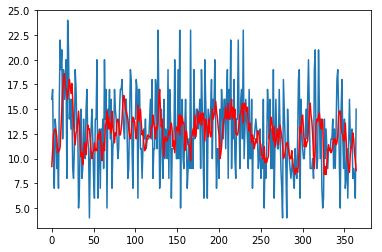

Error for community 1: 4.327623917015351


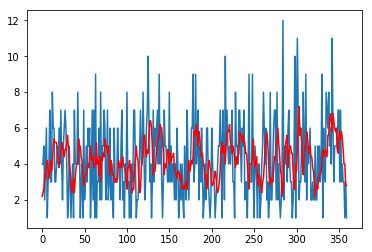

Error for community 2: 2.3901650338185627


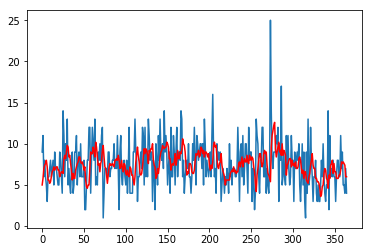

Error for community 3: 3.1799026434653324


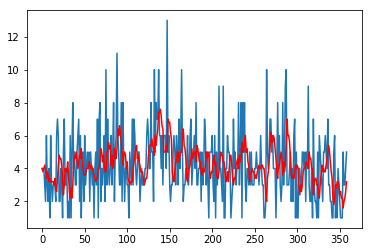

Error for community 4: 2.2066498637459264


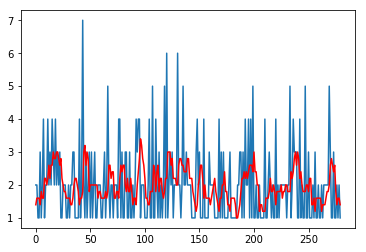

Error for community 5: 1.2528823910145301


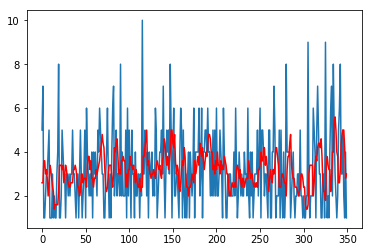

Error for community 6: 1.9704096745890907


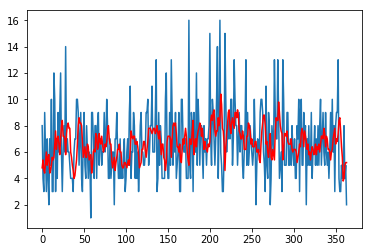

Error for community 7: 2.8529914895702793


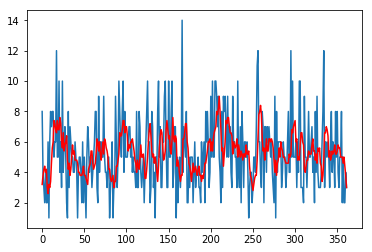

Error for community 8: 2.5125980918703887


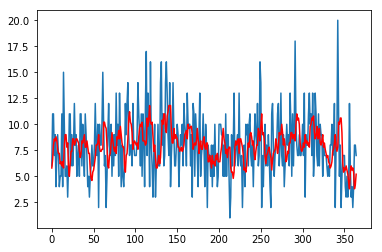

Error for community 9: 3.352561890983776


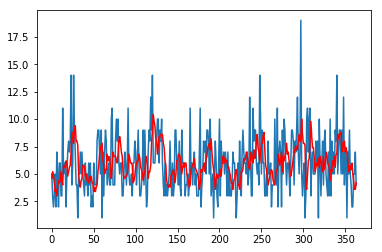

Error for community 10: 2.8694296251391798


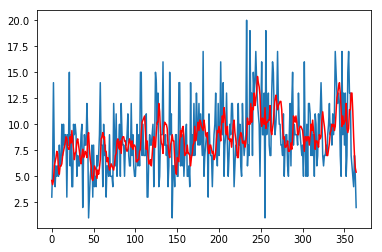

Error for community 11: 3.4527574844717006


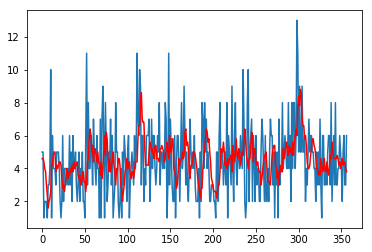

Error for community 12: 2.2982151154943775


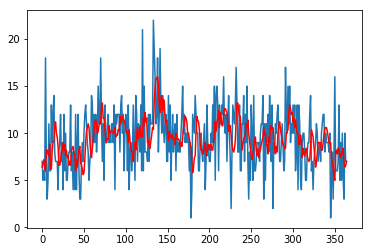

Error for community 13: 3.486742012683717


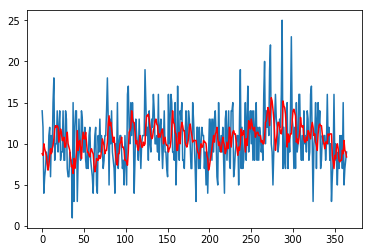

Error for community 14: 3.784756737446125


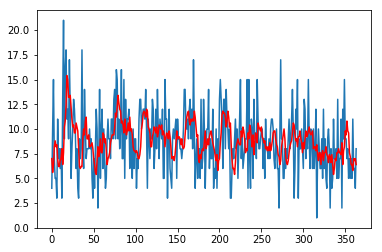

Error for community 15: 3.4291574590737124


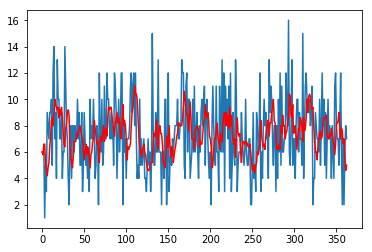

Error for community 16: 3.0030287741181936


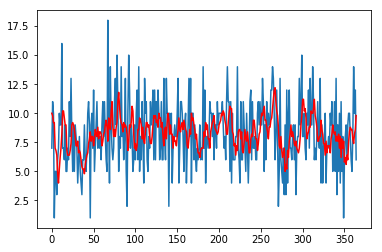

Error for community 17: 3.0818958762068553


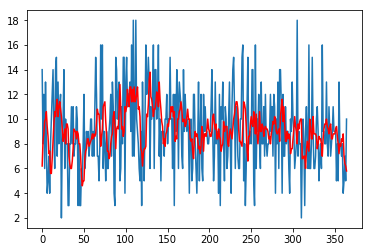

Error for community 18: 3.5550311637653005


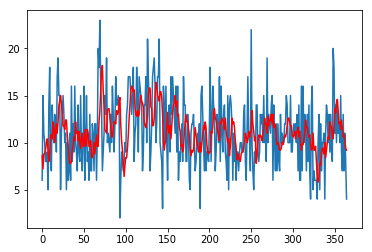

Error for community 19: 3.940600051657525


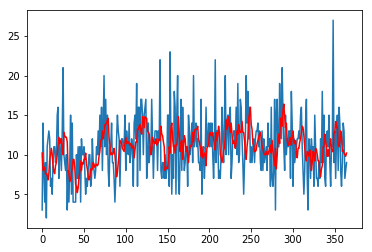

Error for community 20: 4.144433467571085


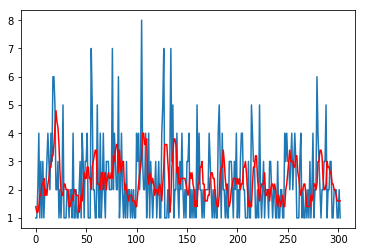

Error for community 21: 1.4855075473612804


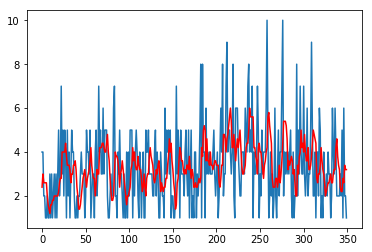

Error for community 22: 1.9154111830100606


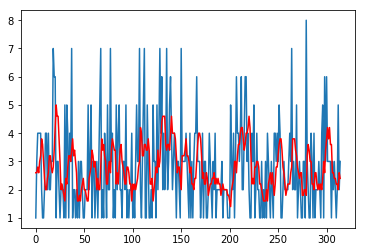

Error for community 23: 1.6852676298223332


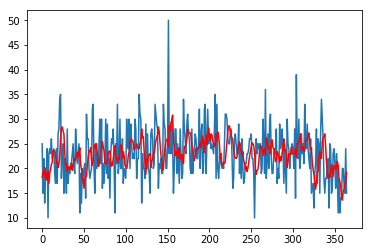

Error for community 24: 5.624778838879034


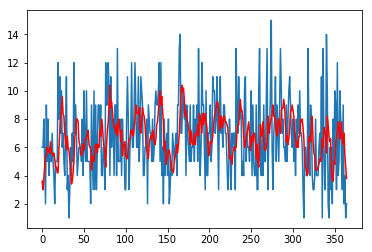

Error for community 25: 2.9531872728449087


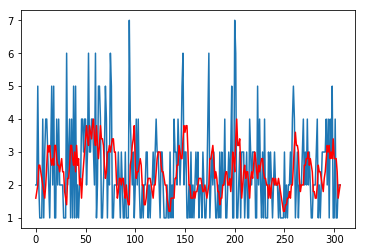

Error for community 26: 1.4186289660522498


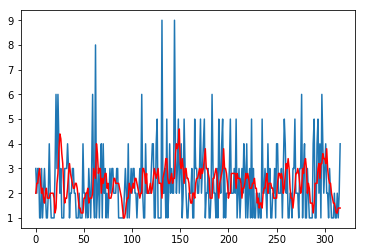

Error for community 27: 1.5381581841179681


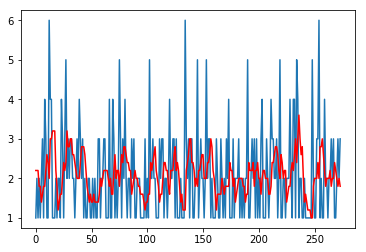

Error for community 28: 1.2501678719392837


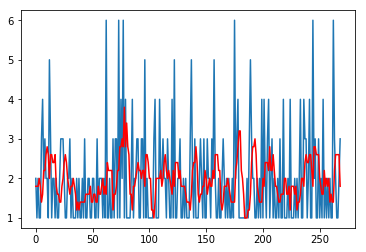

Error for community 29: 1.331684234204285


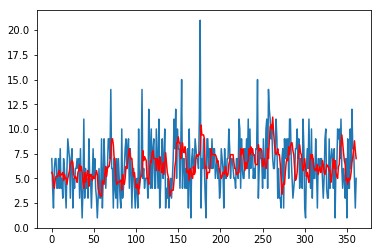

Error for community 30: 2.989927843324533


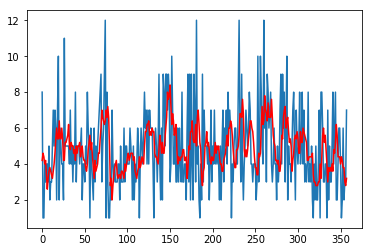

Error for community 31: 2.3643062690942163


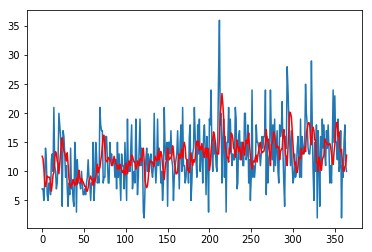

Error for community 32: 5.198798596725504


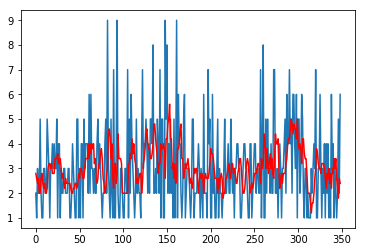

Error for community 33: 1.897517606216759


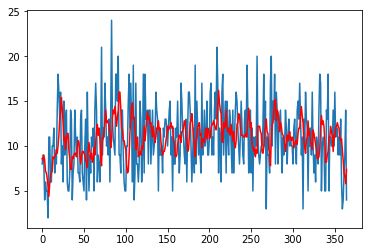

Error for community 34: 4.129625675430896


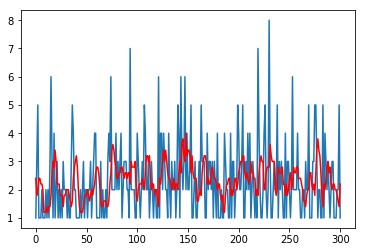

Error for community 35: 1.4822538284518387


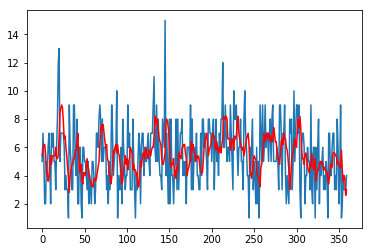

Error for community 36: 2.410486350188369


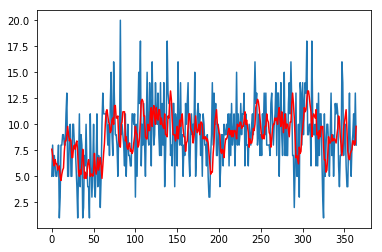

Error for community 37: 3.4427131702485383


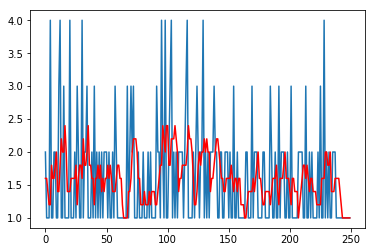

Error for community 38: 0.8759908675323048


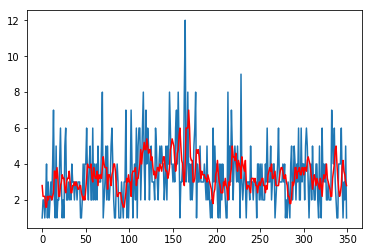

Error for community 39: 1.8421726303471129


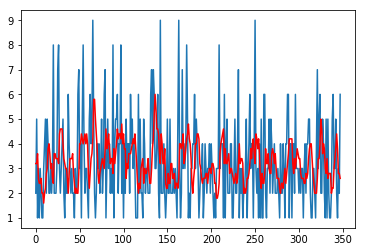

Error for community 40: 1.9624052799456642


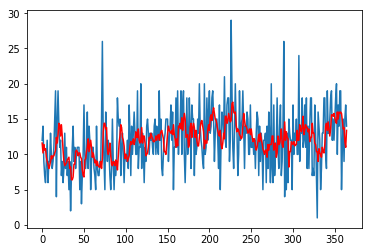

Error for community 41: 4.33673066684021


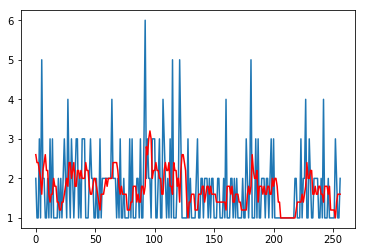

Error for community 42: 1.0272550405269074


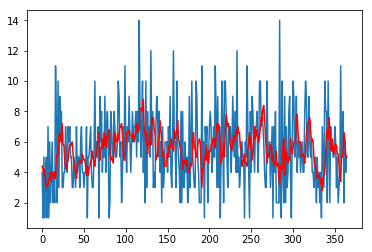

Error for community 43: 2.7072910182568566


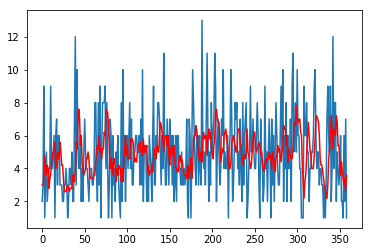

Error for community 44: 2.615147646784915


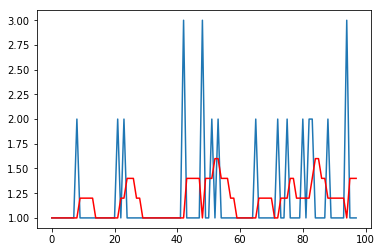

Error for community 45: 0.5086998232789959


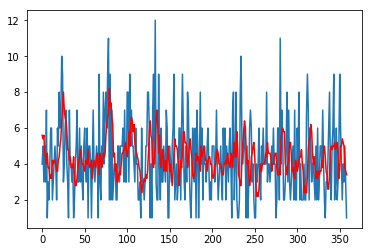

Error for community 46: 2.3931657568653426


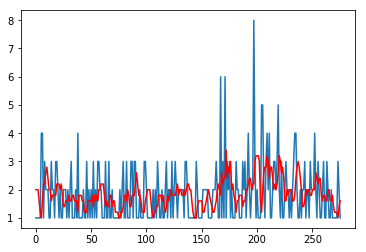

Error for community 47: 1.1478398110729817


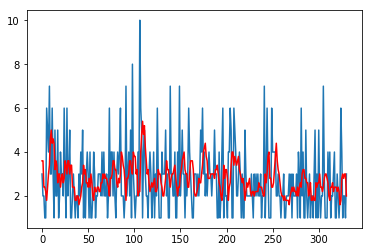

Error for community 48: 1.7191299703585223


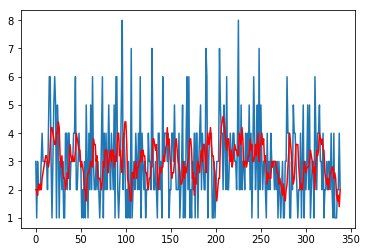

Error for community 49: 1.6207358392924376


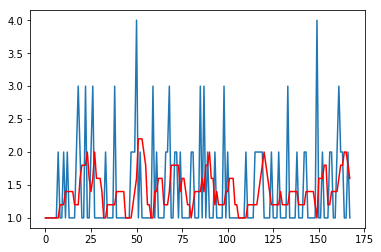

Error for community 50: 0.7395300953340317


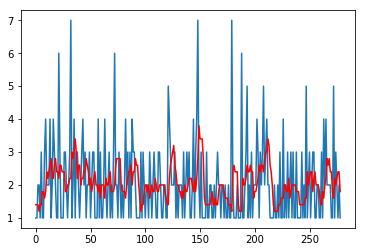

Error for community 51: 1.2959268973586013


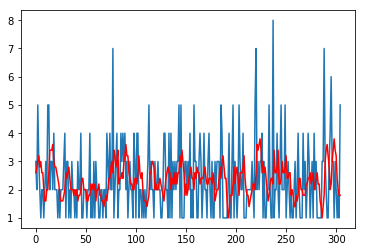

Error for community 52: 1.4251143181064918


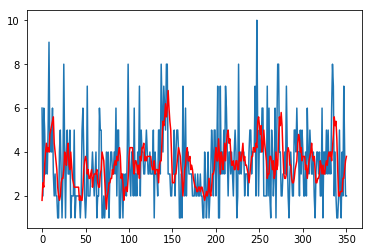

Error for community 53: 1.850294501853622


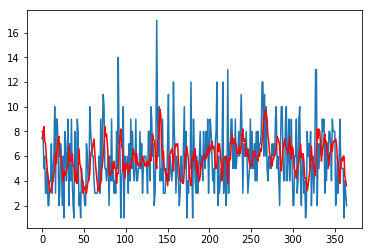

Error for community 54: 2.872944172652522


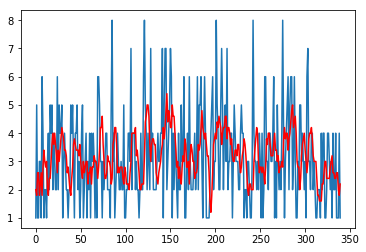

Error for community 55: 1.7991174306897715


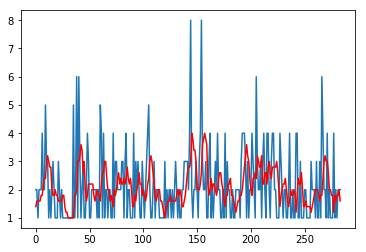

Error for community 56: 1.3289305241539788


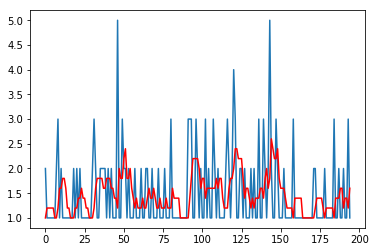

Error for community 57: 0.8143583284890548


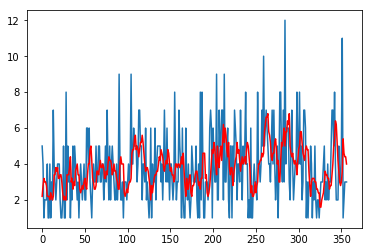

Error for community 58: 2.097831346544192


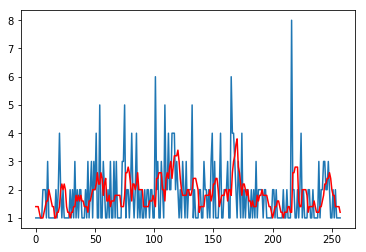

Error for community 59: 1.1612610093269065


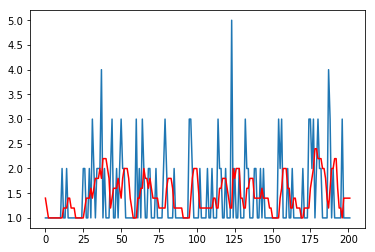

Error for community 60: 0.8077593995273299


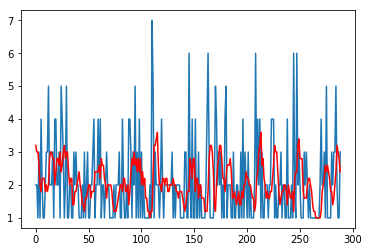

Error for community 61: 1.3909743666154726


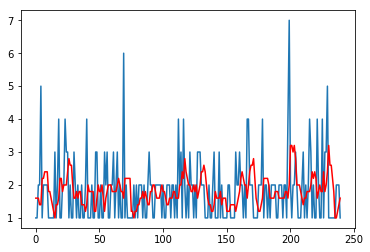

Error for community 62: 1.101135777277262


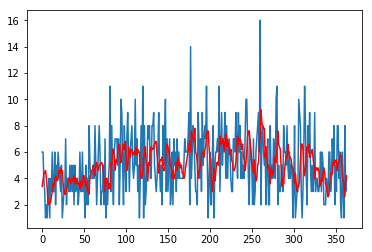

Error for community 63: 2.594351429675506


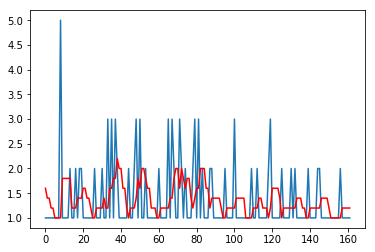

Error for community 64: 0.7371952184621499


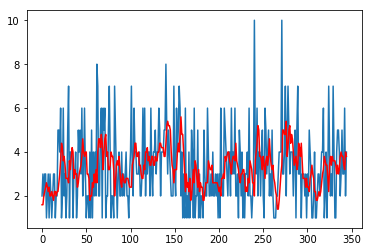

Error for community 65: 1.8613381504028033


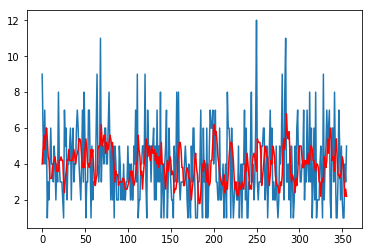

Error for community 66: 2.3019044387080494


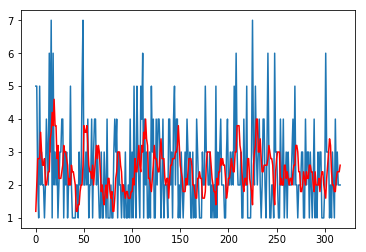

Error for community 67: 1.49506021528185


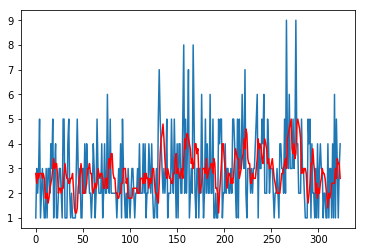

Error for community 68: 1.6624019510676653


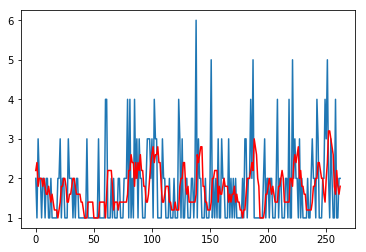

Error for community 69: 1.076962352519923


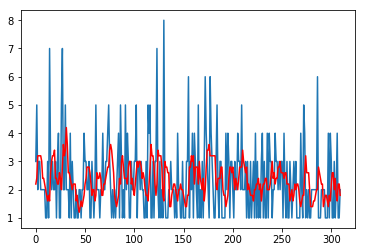

Error for community 70: 1.4849785487752274


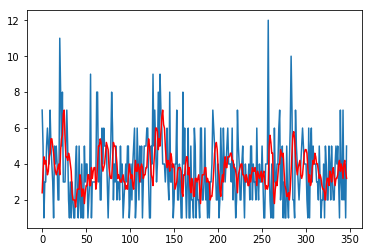

Error for community 71: 2.185965188202818


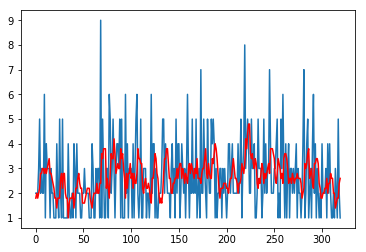

Error for community 72: 1.6278052709092694


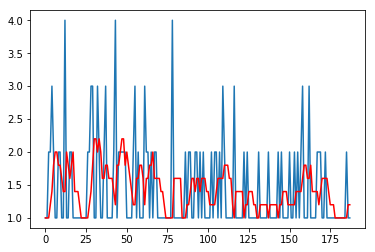

Error for community 73: 0.7378808068423944


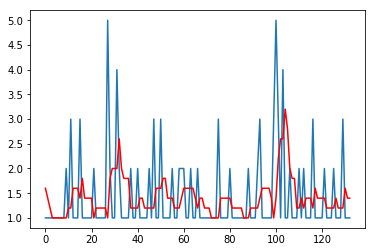

Error for community 74: 0.8853018685715288


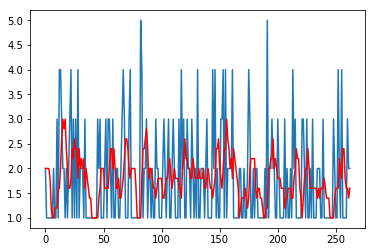

Error for community 75: 1.0980106449510658


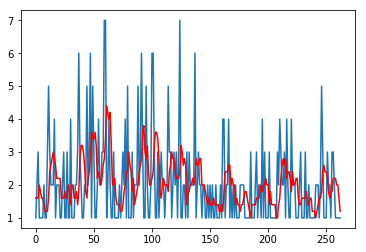

Error for community 76: 1.3722397112367275


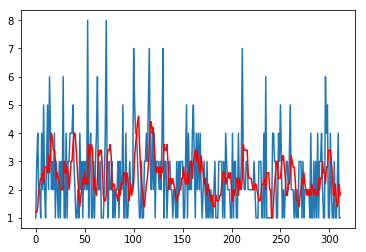

Error for community 77: 1.5455892578062758
Test RMSE: 2.584


In [11]:
# prepare situation
window = 5
predTot = list()
testTot = list()
# walk forward over time steps in test
for distNum in range(len(train_d_day)):
    
    history = train_d_day[distNum]
    test = test_d_day[distNum]
    preds = []
    for t in range(len(test)):
        length = len(history)
        yhat = mean([history[i] for i in range(length - window, length)])
        obs = test[t]
        preds.append(yhat)
        history.append(obs)
        
    # plot
    plt.plot(test)
    plt.plot(preds, color='red')
    plt.show()
    
    error = mean_squared_error(preds, test) ** .5
    print('Error for community {}: {}'.format(distNum+1, error))
    
    testTot = testTot + test
    predTot = predTot + preds
error = mean_squared_error(predTot, testTot) ** .5
print('Test RMSE: %.3f' % error)

### Bidirectional LSTM for Community 1

Let's just try LSTM based approach for one community and see if this approach improves our RMSE score

Community: 77
Actuals: [16, 17, 10, 7, 14, 13, 9, 11, 7, 16, 22, 19, 21, 12, 19, 16, 17, 20, 8, 24, 21, 14, 16, 13, 16, 9, 8, 11, 19, 17, 13, 14, 5, 7, 12, 15, 8, 9, 14, 11, 10, 15, 17, 12, 11, 4, 10, 13, 15, 12, 8, 6, 14, 14, 20, 6, 10, 13, 7, 13, 11, 14, 9, 20, 14, 17, 5, 15, 14, 17, 12, 16, 7, 11, 12, 17, 15, 14, 12, 10, 11, 15, 17, 17, 18, 15, 13, 12, 16, 16, 13, 8, 9, 14, 19, 18, 11, 7, 14, 14, 14, 18, 17, 6, 17, 17, 11, 11, 8, 11, 13, 12, 14, 11, 12, 12, 12, 14, 16, 12, 18, 8, 11, 11, 18, 17, 11, 23, 16, 7, 9, 15, 12, 8, 16, 10, 13, 12, 10, 19, 8, 17, 14, 6, 11, 11, 11, 20, 13, 10, 10, 19, 10, 23, 5, 14, 16, 10, 9, 13, 16, 12, 7, 9, 12, 9, 23, 9, 12, 9, 19, 12, 13, 15, 15, 13, 14, 16, 9, 19, 15, 10, 6, 20, 16, 13, 6, 15, 14, 13, 15, 18, 10, 16, 15, 20, 13, 7, 11, 11, 8, 15, 11, 17, 15, 12, 16, 16, 11, 16, 19, 8, 17, 14, 22, 9, 14, 12, 18, 10, 8, 14, 14, 22, 14, 9, 16, 17, 12, 23, 10, 13, 16, 14, 12, 9, 17, 10, 10, 16, 7, 12, 12, 13, 14, 13, 12, 9, 10, 13, 8, 10, 9, 16, 5, 10, 8, 

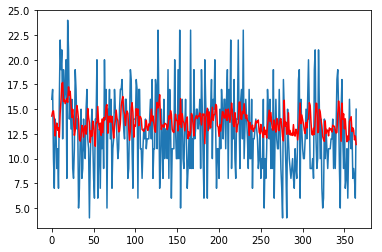

Test RMSE: 4.191


In [13]:
# prepare situation
window = 3
predTot = list()
testTot = list()

#community 1
history = train_d_day[0]
test = test_d_day[0]
preds = []
for t in tqdm_notebook(range(len(test)), leave=False):

    length = len(history)

    # split into samples
    X, y = split_sequence(history, window)

    # reshape from [samples, timesteps] into [samples, timesteps, features]
    n_features = 1
    X = X.reshape((X.shape[0], X.shape[1], n_features))

    model = Sequential()
    model.add(Bidirectional(LSTM(32, activation='relu'), input_shape=(window, n_features)))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse')

    # fit model
    model.fit(X, y, epochs=100, verbose=0)

    X_test = array([history[i] for i in range(length-window, length)])
    X_test = X_test.reshape((1, window, n_features))
    yhat = model.predict(X_test, verbose=0)

    obs = test[t]
    preds.append(yhat.reshape((1,)))
    history.append(obs)
    
preds_new = [i[0] for i in preds]
print('Community: {}'.format(distNum+1))
print('Actuals: {}'.format(test))
print('Predictions: {}'.format(preds_new))
    
# plot
plt.plot(test)
plt.plot(preds_new, color='red')
plt.show()

error = mean_squared_error(preds_new, test) ** .5
print('Test RMSE: %.3f' % error)

When we applied Simple moving average for Community 1 day predicitons, we got a RMSE score of 4.3276 <br>
With bi-directional LSTM approach, we got a RMSE score of 4.191 which is an improvement.

## Night

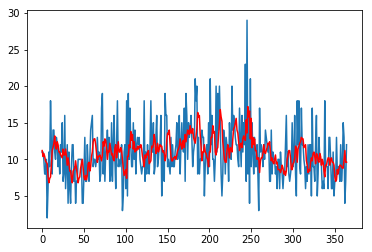

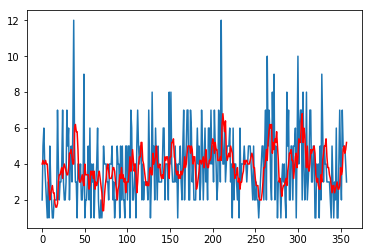

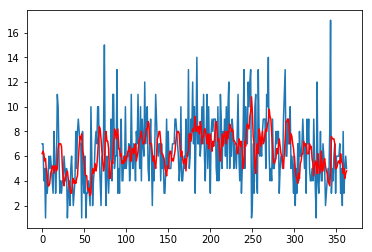

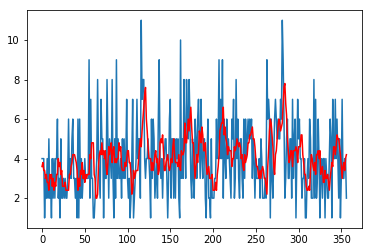

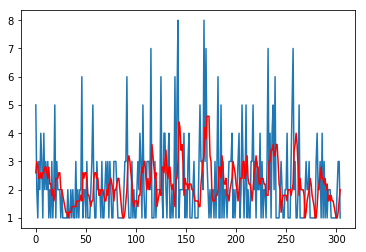

...

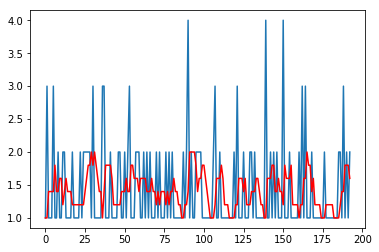

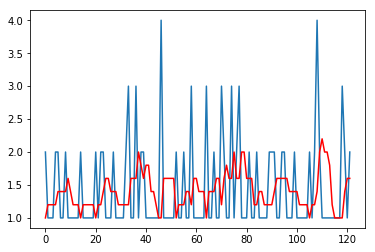

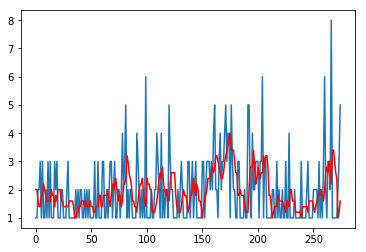

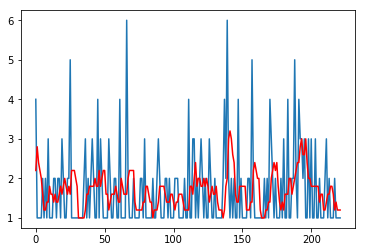

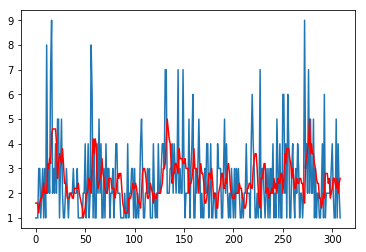

Test RMSE: 2.690


In [71]:
# prepare situation
window = 5
predTot = list()
testTot = list()
# walk forward over time steps in test
for distNum in range(len(train_d_night)):
    
    history = train_d_night[distNum]
    test = test_d_night[distNum]
    preds = []
    for t in range(len(test)):
        length = len(history)
        yhat = mean([history[i] for i in range(length - window, length)])
        obs = test[t]
        preds.append(yhat)
        history.append(obs)
        
    # plot
    plt.plot(test)
    plt.plot(preds, color='red')
    plt.show()
    
    testTot = testTot + test
    predTot = predTot + preds
error = mean_squared_error(predTot, testTot) ** .5
print('Test RMSE: %.3f' % error)

We have surprisingly very low RMSE scores for this methodology which is a good sign. We are able to predict crime numbers very accurately!